# Q1.1

Adding data


In [1]:
import numpy as np
from cvxopt import matrix, solvers
import plotly.graph_objects as go

def train_svm_qp(X, Y):
    """
    Trains a hard-margin SVM using QP.
    Returns weights w, bias b, and Lagrange multipliers alphas.
    """
    n_samples, n_features = X.shape
    Y = Y.reshape(-1, 1).astype(float)
    K = X @ X.T

    P = matrix(np.outer(Y, Y) * K)
    q = matrix(-np.ones((n_samples, 1)))
    G = matrix(-np.eye(n_samples))
    h = matrix(np.zeros(n_samples))
    A = matrix(Y.reshape(1, -1))
    b = matrix(np.zeros(1))

    sol = solvers.qp(P, q, G, h, A, b)
    alphas = np.array(sol['x']).flatten()

    sv = alphas > 1e-5
    alpha_sv = alphas[sv]
    sv_X = X[sv]
    sv_Y = Y[sv]

    w = np.sum(alpha_sv[:, None] * sv_Y * sv_X, axis=0)
    b = sv_Y[0] - np.dot(w, sv_X[0])

    return w, b.item(), alphas

def plot_3d_svm_plotly(X, Y, w, b, alphas):
    """
    Plots SVM results using Plotly: data, support vectors, decision plane.
    """
    sv = alphas > 1e-5
    X_pos = X[Y == 1]
    X_neg = X[Y == -1]
    X_sv = X[sv]

    # Create grid for decision plane
    x_range = np.linspace(X[:,0].min()-1, X[:,0].max()+1, 20)
    y_range = np.linspace(X[:,1].min()-1, X[:,1].max()+1, 20)
    xx, yy = np.meshgrid(x_range, y_range)
    zz = (-w[0]*xx - w[1]*yy - b) / w[2]

    fig = go.Figure()

    # Class +1
    fig.add_trace(go.Scatter3d(
        x=X_pos[:, 0], y=X_pos[:, 1], z=X_pos[:, 2],
        mode='markers',
        marker=dict(size=6, color='blue'),
        name='Class +1'
    ))

    # Class -1
    fig.add_trace(go.Scatter3d(
        x=X_neg[:, 0], y=X_neg[:, 1], z=X_neg[:, 2],
        mode='markers',
        marker=dict(size=6, color='red'),
        name='Class -1'
    ))

    # Support Vectors
    fig.add_trace(go.Scatter3d(
        x=X_sv[:, 0], y=X_sv[:, 1], z=X_sv[:, 2],
        mode='markers',
        marker=dict(size=10, color='lime', symbol='diamond-open', line=dict(width=2)),
        name='Support Vectors'
    ))

    # Decision Plane
    fig.add_trace(go.Surface(
        x=xx, y=yy, z=zz,
        showscale=False,
        opacity=0.5,
        colorscale='Greys',
        name='Decision Plane'
    ))

    fig.update_layout(
        title="Interactive 3D SVM",
        scene=dict(
            xaxis_title='x₁',
            yaxis_title='x₂',
            zaxis_title='x₃',
        ),
        legend=dict(x=0.7, y=0.9)
    )

    fig.show()

# === DATA ===
X = np.array([
    [ 1, -1,  1],   # X1
    [-3,  1,  1],   # X2
    [-3,  1, -1],   # X3
    [ 1,  2,  1],   # X4
    [-1, -1,  2]    # X5
], dtype=float)

y = np.array([-1, 1, -1, -1, 1], dtype=float)


# w, b, alphas = train_svm_qp(X, Y)
# plot_3d_svm_plotly(X, Y, w, b, alphas)

# Class +1 (centered around [2, 2, 2])
# X_pos = np.random.normal(loc=2, scale=0.7, size=(10, 3))

# # Class -1 (centered around [0.5, 0.5, 0.5])
# X_neg = np.random.normal(loc=0.5, scale=0.7, size=(10, 3))

# X = np.vstack((X_pos, X_neg))
# Y = np.array([1]*10 + [-1]*10)

w, b, alphas = train_svm_qp(X, y)
plot_3d_svm_plotly(X, y, w, b, alphas)







     pcost       dcost       gap    pres   dres
 0: -5.8671e-01 -1.5647e+00  1e+00  1e-16  1e+00
 1: -6.1811e-01 -6.5236e-01  3e-02  2e-16  1e-01
 2: -6.2499e-01 -6.2638e-01  1e-03  1e-16  2e-16
 3: -6.2500e-01 -6.2501e-01  1e-05  6e-17  4e-16
 4: -6.2500e-01 -6.2500e-01  1e-07  7e-17  2e-16
Optimal solution found.


In [2]:
from sklearn.svm import SVC


X = np.array([
    [ 1, -1,  1],   # X1
    [-3,  1,  1],   # X2
    [-3,  1, -1],   # X3
    [ 1,  2,  1],   # X4
    [-1, -1,  2]    # X5
], dtype=float)

y = np.array([-1, 1, -1, -1, 1], dtype=float)

N = X.shape[0]



clf = SVC(kernel='linear', C=1e10)   # big C → hard margin
clf.fit(X, y)
print("\nscikit-learn w =", clf.coef_[0], ", b =", clf.intercept_[0])



scikit-learn w = [-4.99956384e-01 -1.74464249e-04  1.00000000e+00] , b = -1.4998865982379106


# Q1.2

## Q1.2.2

In [3]:
import pandas as pd
df = pd.read_csv('PRSA_data_2010.1.1-2014.12.31.csv')
df.head(100)


,No,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,cbwd,Iws,Is,Ir
0,1,2010,1,1,0,NaN,-21,-11.0,1021.0,NW,1.79,0,0
1,2,2010,1,1,1,NaN,-21,-12.0,1020.0,NW,4.92,0,0
2,3,2010,1,1,2,NaN,-21,-11.0,1019.0,NW,6.71,0,0
3,4,2010,1,1,3,NaN,-21,-14.0,1019.0,NW,9.84,0,0
4,5,2010,1,1,4,NaN,-20,-12.0,1018.0,NW,12.97,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,2010,1,4,23,31.0,-26,-15.0,1035.0,NW,198.45,0,0
96,97,2010,1,5,0,30.0,-26,-17.0,1035.0,NW,201.58,0,0
97,98,2010,1,5,1,34.0,-26,-18.0,1035.0,NW,205.60,0,0
98,99,2010,1,5,2,27.0,-26,-19.0,1035.0,NW,208.73,0,0


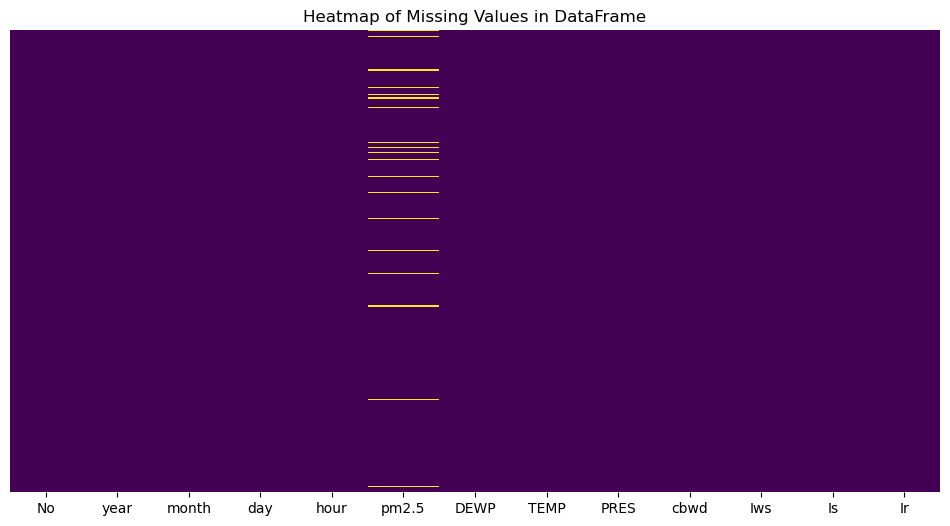

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is called df
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Heatmap of Missing Values in DataFrame')
plt.show()


In [5]:
print(df.info())
print(df.describe(include='all'))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43824 entries, 0 to 43823
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   No      43824 non-null  int64  
 1   year    43824 non-null  int64  
 2   month   43824 non-null  int64  
 3   day     43824 non-null  int64  
 4   hour    43824 non-null  int64  
 5   pm2.5   41757 non-null  float64
 6   DEWP    43824 non-null  int64  
 7   TEMP    43824 non-null  float64
 8   PRES    43824 non-null  float64
 9   cbwd    43824 non-null  object 
 10  Iws     43824 non-null  float64
 11  Is      43824 non-null  int64  
 12  Ir      43824 non-null  int64  
dtypes: float64(4), int64(8), object(1)
memory usage: 4.3+ MB
None
                  No          year         month           day          hour  \
count   43824.000000  43824.000000  43824.000000  43824.000000  43824.000000   
unique           NaN           NaN           NaN           NaN           NaN   
top              NaN         

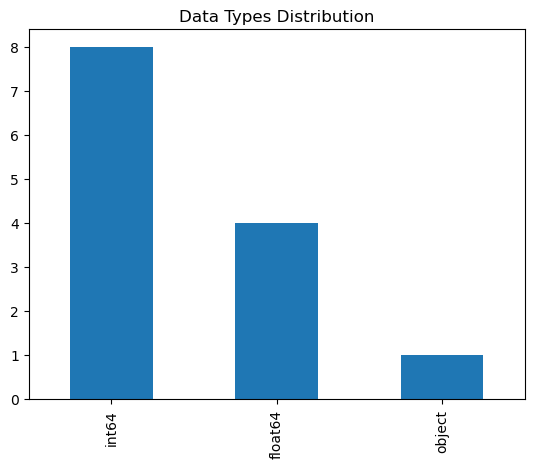

In [6]:
df.dtypes.value_counts().plot(kind='bar', title='Data Types Distribution')
plt.show()


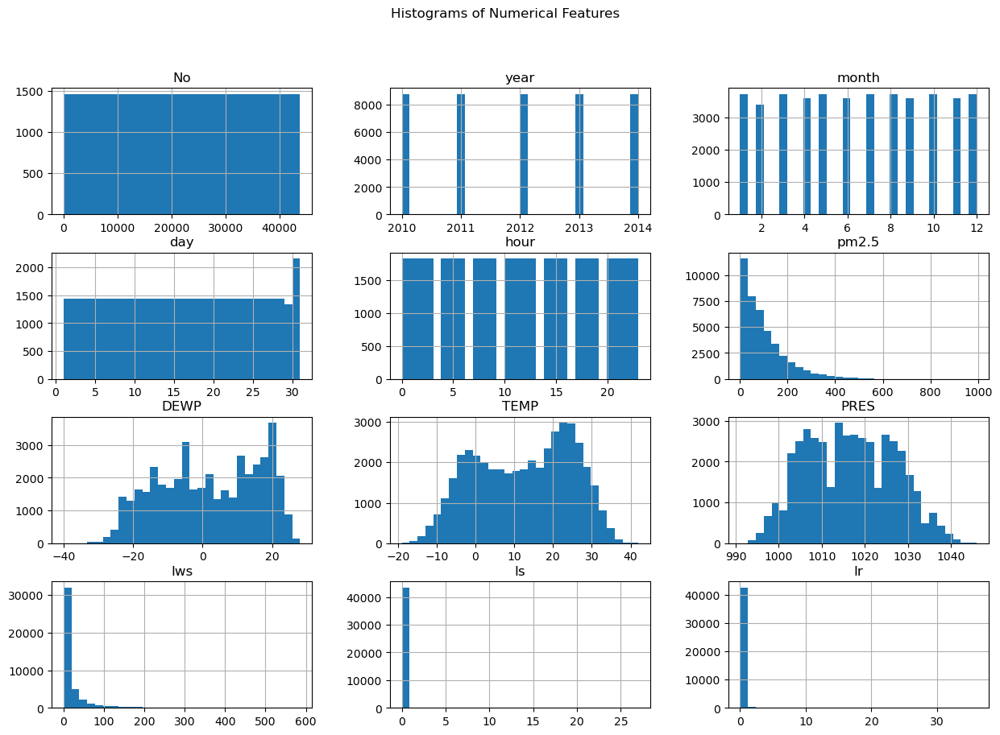

In [7]:
df.select_dtypes(include=['number']).hist(bins=30, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()


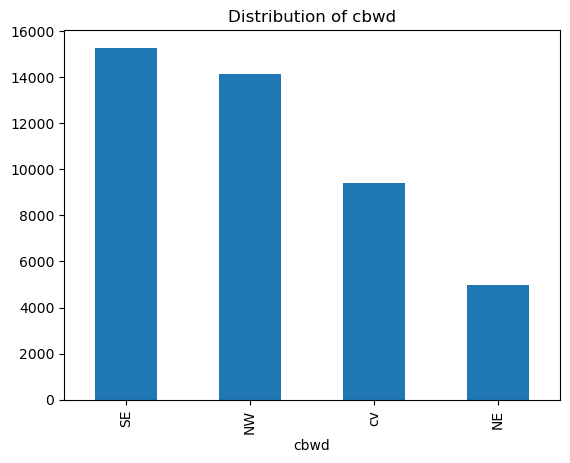

In [8]:
cat_cols = df.select_dtypes(include='object').columns
for col in cat_cols:
    if df[col].nunique() <= 10:  # limit to small cardinality
        df[col].value_counts().plot(kind='bar', title=f'Distribution of {col}')
        plt.show()


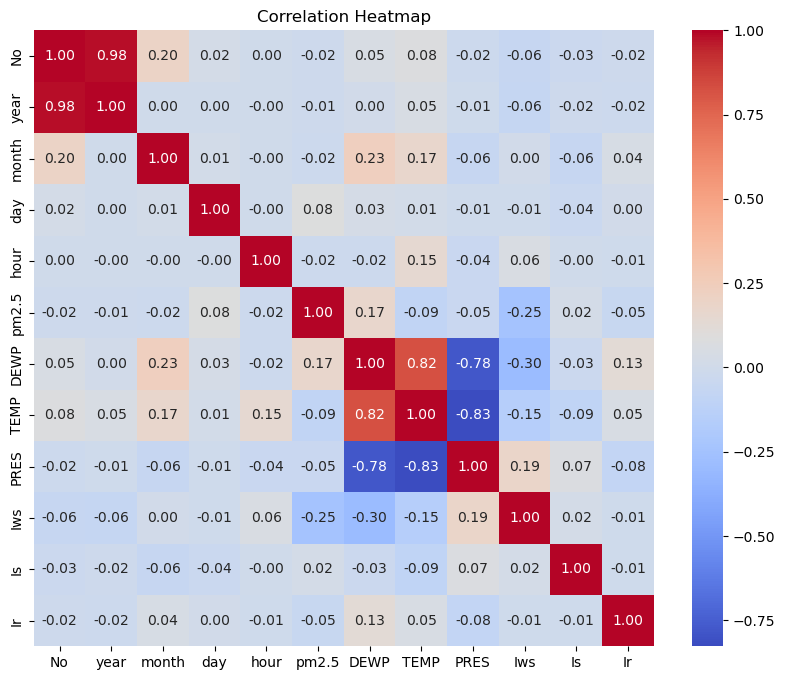

In [9]:
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(numeric_only=True), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


## Q1.2.3

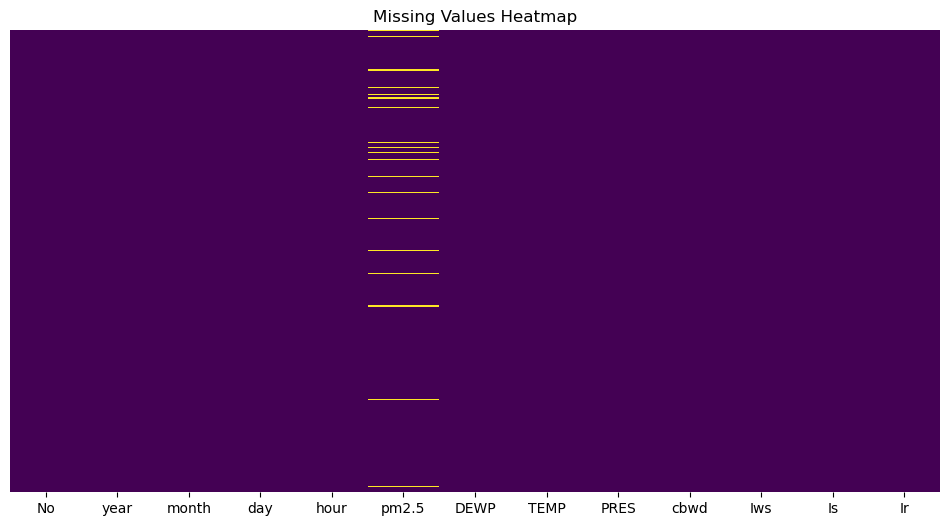

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Values Heatmap')
plt.show()


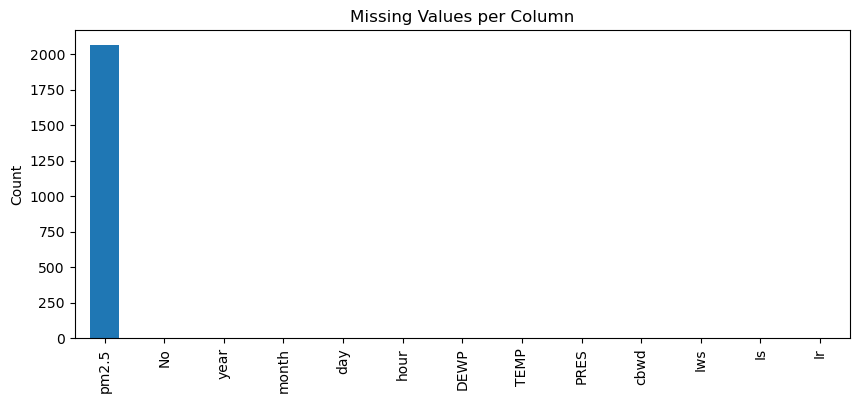

In [11]:
df.isnull().sum().sort_values(ascending=False).plot(kind='bar', figsize=(10, 4), title='Missing Values per Column')
plt.ylabel("Count")
plt.show()


In [12]:
# Create lag features
df['pm2.5_lag1'] = df['pm2.5'].shift(1)
df['pm2.5_lag2'] = df['pm2.5'].shift(2)
df['pm2.5_lag3'] = df['pm2.5'].shift(3)
df['pm2.5_lag24'] = df['pm2.5'].shift(24)
df['pm2.5_lag168'] = df['pm2.5'].shift(168)

# Check for NaN in new lag columns
print(df[['pm2.5_lag3', 'pm2.5_lag24', 'pm2.5_lag168','pm2.5_lag1','pm2.5_lag2']].isna().sum())

pm2.5_lag3      2070
pm2.5_lag24     2091
pm2.5_lag168    2235
pm2.5_lag1      2068
pm2.5_lag2      2069
dtype: int64


dropping the first row, which is only the number of row and has no information

In [13]:
df = df.drop(columns='No')


In [14]:
nan_pm25_rows = df['pm2.5'].isna().sum()
total_rows = len(df)
percent_nan = (nan_pm25_rows / total_rows) * 100

print(f"Rows with NaN in 'pm2.5': {nan_pm25_rows}")
print(f"Total rows: {total_rows}")
print(f"Percentage to be dropped: {percent_nan:.2f}%")


Rows with NaN in 'pm2.5': 2067
Total rows: 43824
Percentage to be dropped: 4.72%


dropping the NAN rows, since these are just 4 percent of our data

In [15]:
# Drop rows with NaN in target or any lag features
df = df.dropna(subset=['pm2.5', 'pm2.5_lag1', 'pm2.5_lag2', 'pm2.5_lag3', 'pm2.5_lag24', 'pm2.5_lag168'])

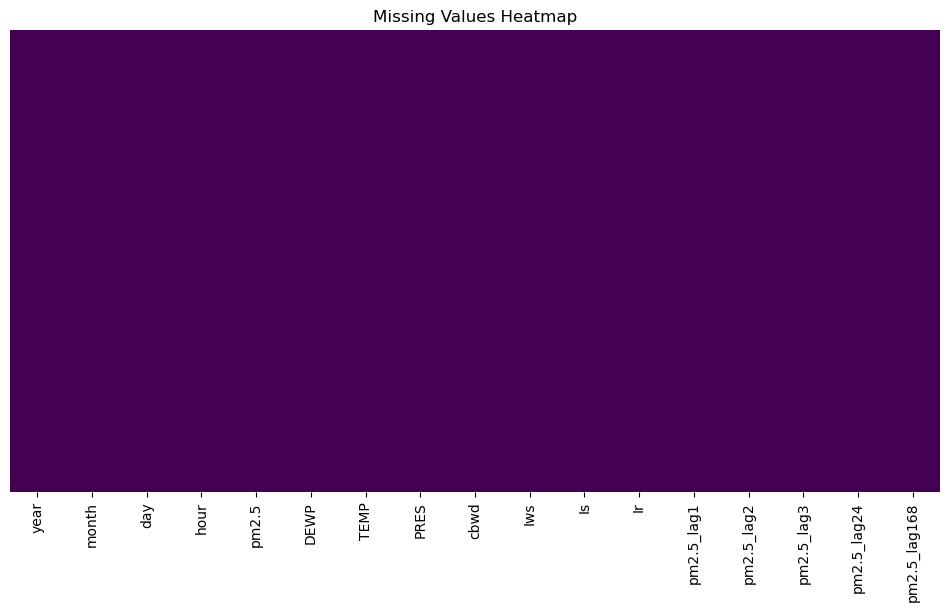

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Values Heatmap')
plt.show()

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38424 entries, 192 to 43823
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          38424 non-null  int64  
 1   month         38424 non-null  int64  
 2   day           38424 non-null  int64  
 3   hour          38424 non-null  int64  
 4   pm2.5         38424 non-null  float64
 5   DEWP          38424 non-null  int64  
 6   TEMP          38424 non-null  float64
 7   PRES          38424 non-null  float64
 8   cbwd          38424 non-null  object 
 9   Iws           38424 non-null  float64
 10  Is            38424 non-null  int64  
 11  Ir            38424 non-null  int64  
 12  pm2.5_lag1    38424 non-null  float64
 13  pm2.5_lag2    38424 non-null  float64
 14  pm2.5_lag3    38424 non-null  float64
 15  pm2.5_lag24   38424 non-null  float64
 16  pm2.5_lag168  38424 non-null  float64
dtypes: float64(9), int64(7), object(1)
memory usage: 5.3+ MB


## Q1.2.4

In [18]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns
print("Categorical columns:", cat_cols.tolist())


Categorical columns: ['cbwd']


In [19]:
encoded = pd.get_dummies(df['cbwd'], prefix='cbwd')
df = pd.concat([df, encoded], axis=1)


In [20]:
df = df.drop(columns='cbwd')


In [21]:
df = df.astype({col: 'int' for col in df.select_dtypes('bool').columns})


In [22]:
df.head()

,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,Iws,Is,Ir,pm2.5_lag1,pm2.5_lag2,pm2.5_lag3,pm2.5_lag24,pm2.5_lag168,cbwd_NE,cbwd_NW,cbwd_SE,cbwd_cv
192,2010,1,9,0,165.0,-17,-13.0,1027.0,0.89,0,0,169.0,168.0,225.0,210.0,129.0,0,0,0,1
193,2010,1,9,1,159.0,-17,-13.0,1027.0,3.13,0,0,165.0,169.0,168.0,195.0,148.0,0,1,0,0
194,2010,1,9,2,167.0,-17,-14.0,1027.0,4.92,0,0,159.0,165.0,169.0,275.0,159.0,0,1,0,0
195,2010,1,9,3,196.0,-17,-15.0,1027.0,8.05,0,0,167.0,159.0,165.0,164.0,181.0,0,1,0,0
196,2010,1,9,4,169.0,-17,-13.0,1027.0,9.84,0,0,196.0,167.0,159.0,110.0,138.0,0,1,0,0


## Q1.2.5

In [23]:
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers[[column]]

for col in ['pm2.5', 'TEMP', 'DEWP', 'Iws']:
    outliers = detect_outliers_iqr(df, col)
    print(f"{col}: {len(outliers)} outliers ({100*len(outliers)/len(df):.2f}%)")


pm2.5: 1638 outliers (4.26%)
TEMP: 0 outliers (0.00%)
DEWP: 0 outliers (0.00%)
Iws: 4474 outliers (11.64%)


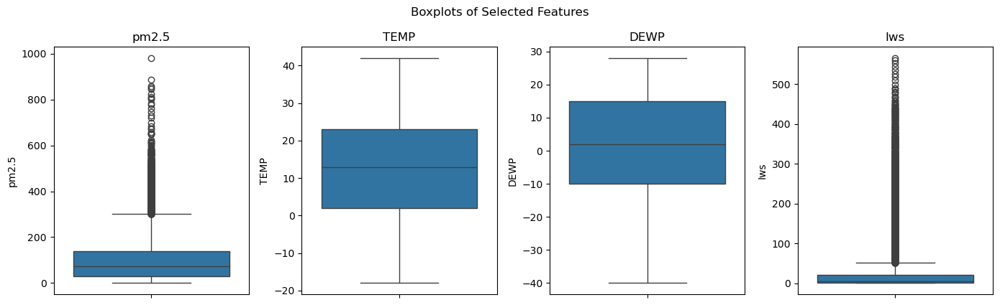

In [24]:
# Plotting boxplots for selected columns
columns_to_plot = ['pm2.5', 'TEMP', 'DEWP', 'Iws']

plt.figure(figsize=(14, 4))  # Wider figure for side-by-side plots
for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(1, 4, i)
    sns.boxplot(y=df[col])
    plt.title(col)
    plt.tight_layout()

plt.suptitle('Boxplots of Selected Features', y=1.05)
plt.show()


<Figure size 500x1000 with 0 Axes>

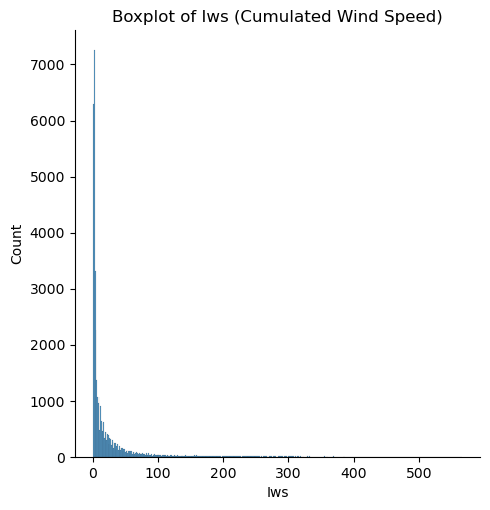

In [25]:
# Plot the distribution of 'Iws'
plt.figure(figsize=(5, 10))
sns.displot(x=df['Iws'])
plt.title('Boxplot of Iws (Cumulated Wind Speed)')
plt.xlabel('Iws')
plt.show()

we can  not drop anything from the pm 2.5 column since that is the target. and for the lws, we would rather not to drop them, but to cap them at a max value. 

In [26]:
# Calculate the 1st and 99th percentiles
lower_cap = df['Iws'].quantile(0.01)
upper_cap = df['Iws'].quantile(0.99)

# Apply capping
df['Iws'] = df['Iws'].clip(lower=lower_cap, upper=upper_cap)


<Figure size 500x1000 with 0 Axes>

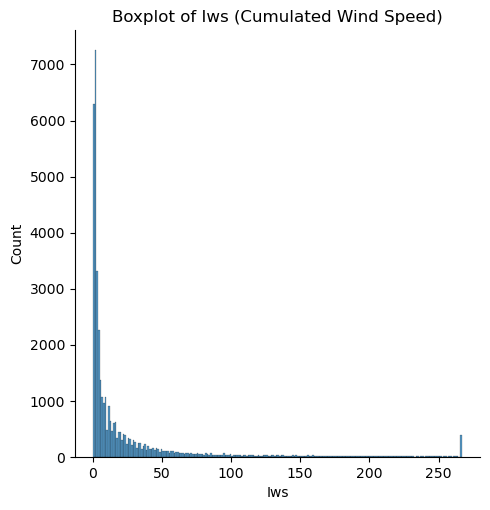

In [27]:
# Plot the distribution of 'Iws'
plt.figure(figsize=(5, 10))
sns.displot(x=df['Iws'])
plt.title('Boxplot of Iws (Cumulated Wind Speed)')
plt.xlabel('Iws')
plt.show()  

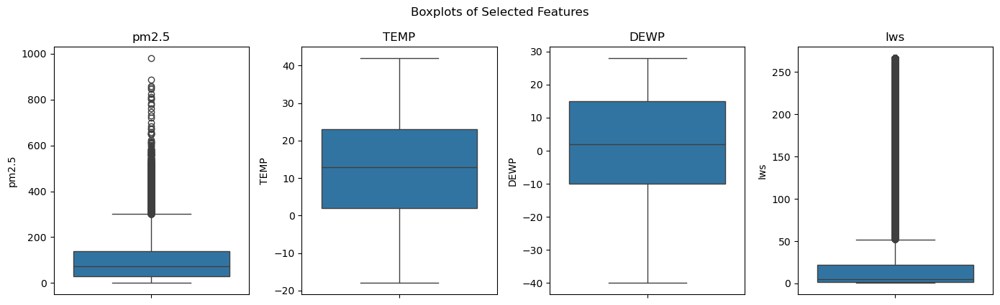

In [28]:
# Plotting boxplots for selected columns
columns_to_plot = ['pm2.5', 'TEMP', 'DEWP', 'Iws']

plt.figure(figsize=(14, 4))  # Wider figure for side-by-side plots
for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(1, 4, i)
    sns.boxplot(y=df[col])
    plt.title(col)
    plt.tight_layout()

plt.suptitle('Boxplots of Selected Features', y=1.05)
plt.show()

## Q1.2.6

In [29]:
def categorize_aqi(pm):
    if pm <= 12.0:
        return 'Good'
    elif pm <= 35.4:
        return 'Moderate'
    elif pm <= 55.4:
        return 'Unhealthy for Sensitive Groups'
    elif pm <= 150.4:
        return 'Unhealthy'
    elif pm <= 250.4:
        return 'Very Unhealthy'
    elif pm <= 350.4:
        return 'Hazardous'
    elif pm <= 500:
        return 'Hazardous'
    else:
        return 'Extreme'  # Optional: if any values exceed 500

# Apply the function to create a new categorical column
df['AQI_Category'] = df['pm2.5'].apply(categorize_aqi)


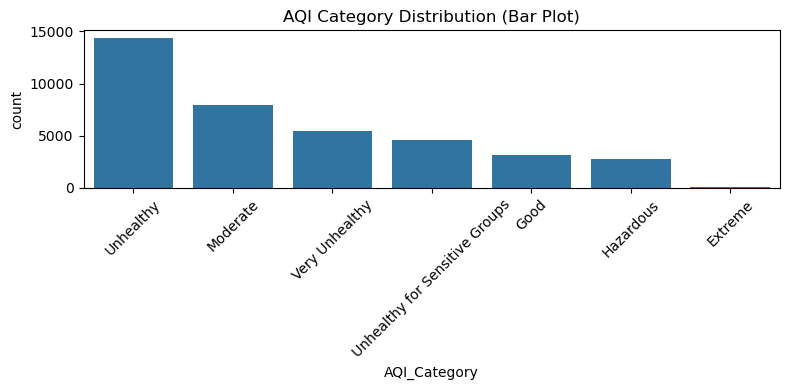

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
sns.countplot(x='AQI_Category', data=df, order=df['AQI_Category'].value_counts().index)
plt.title('AQI Category Distribution (Bar Plot)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


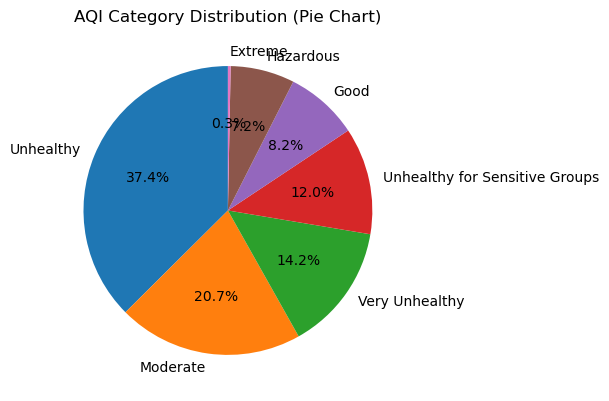

In [31]:
plt.figure(figsize=(6, 6))
df['AQI_Category'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.ylabel('')
plt.title('AQI Category Distribution (Pie Chart)')
plt.tight_layout()
plt.show()


## Q1.2.7

### Lag Feature

In [32]:
df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
df.set_index('datetime', inplace=True)


In [33]:
df.index = pd.to_datetime(df.index)


In [34]:
df.index

DatetimeIndex(['2010-01-09 00:00:00', '2010-01-09 01:00:00',
               '2010-01-09 02:00:00', '2010-01-09 03:00:00',
               '2010-01-09 04:00:00', '2010-01-09 05:00:00',
               '2010-01-09 06:00:00', '2010-01-09 07:00:00',
               '2010-01-09 08:00:00', '2010-01-09 09:00:00',
               ...
               '2014-12-31 14:00:00', '2014-12-31 15:00:00',
               '2014-12-31 16:00:00', '2014-12-31 17:00:00',
               '2014-12-31 18:00:00', '2014-12-31 19:00:00',
               '2014-12-31 20:00:00', '2014-12-31 21:00:00',
               '2014-12-31 22:00:00', '2014-12-31 23:00:00'],
              dtype='datetime64[ns]', name='datetime', length=38424, freq=None)

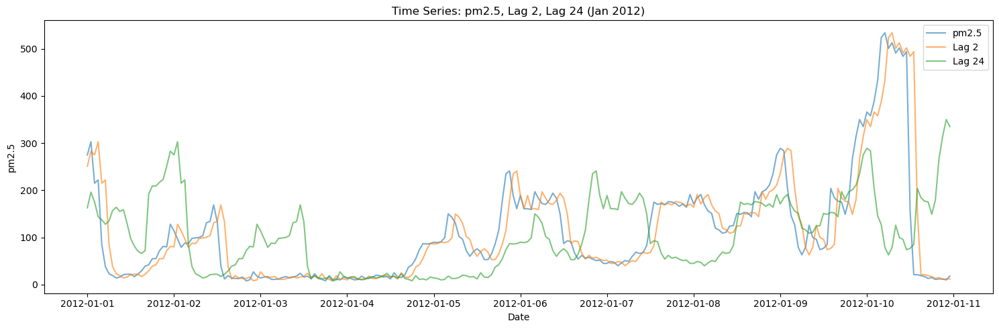

In [35]:
# Define a specific time range (e.g., January 2012)
start_date = '2012-01-01'
end_date = '2012-01-10'

# Slice the DataFrame to that period
df_period = df.loc[start_date:end_date]

# Plot the subset
plt.figure(figsize=(15, 5))
plt.plot(df_period.index, df_period['pm2.5'], label='pm2.5', alpha=0.6)
plt.plot(df_period.index, df_period['pm2.5_lag2'], label='Lag 2', alpha=0.6)
plt.plot(df_period.index, df_period['pm2.5_lag24'], label='Lag 24', alpha=0.6)
plt.legend()
plt.title('Time Series: pm2.5, Lag 2, Lag 24 (Jan 2012)')
plt.xlabel('Date')
plt.ylabel('pm2.5')
plt.tight_layout()
plt.show()

In [36]:
import plotly.graph_objects as go

# Create the figure
fig = go.Figure()

# Add pm2.5 trace
fig.add_trace(go.Scatter(x=df.index, y=df['pm2.5'], mode='lines', name='pm2.5'))

# Add lag 2 trace
fig.add_trace(go.Scatter(x=df.index, y=df['pm2.5_lag2'], mode='lines', name='Lag 2'))

# Add lag 24 trace
fig.add_trace(go.Scatter(x=df.index, y=df['pm2.5_lag24'], mode='lines', name='Lag 24'))

# Update layout
fig.update_layout(
    title='Interactive Time Series: pm2.5, Lag 2, Lag 24',
    xaxis_title='Date',
    yaxis_title='pm2.5 Value',
    hovermode='x unified',
    template='plotly_white'
)

fig.show()


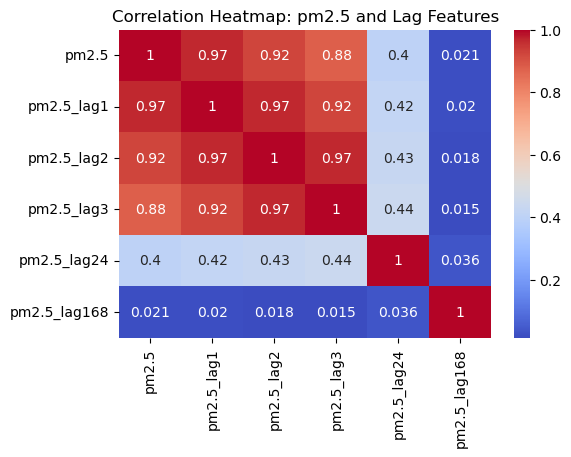

In [37]:
# Create correlation heatmap of pm2.5 and its lags
import seaborn as sns

lag_columns = ['pm2.5', 'pm2.5_lag1', 'pm2.5_lag2', 'pm2.5_lag3', 'pm2.5_lag24', 'pm2.5_lag168']
corr = df[lag_columns].corr()

plt.figure(figsize=(6, 4))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap: pm2.5 and Lag Features')
plt.show()

### Rolling Statics

In [38]:
# Rolling window size (24 hours)
# min_period = 1  # Minimum number of observations in the window to calculate the statistic
window = 24
min_period = 1

# Calculate rolling statistics for pm2.5
# min_periods=1 ensures that the first few values are calculated even if the full window isn't available
df['pm2.5_roll_mean_24h'] = df['pm2.5'].rolling(window=window,min_periods= min_period).mean()
df['pm2.5_roll_std_24h'] = df['pm2.5'].rolling(window=window, min_periods= min_period).std()
df['pm2.5_roll_var_24h'] = df['pm2.5'].rolling(window=window, min_periods= min_period).var()
df['pm2.5_roll_min_24h'] = df['pm2.5'].rolling(window=window, min_periods= min_period).min()
df['pm2.5_roll_max_24h'] = df['pm2.5'].rolling(window=window, min_periods= min_period).max()
df['pm2.5_roll_median_24h']=df['pm2.5'].rolling(window=window,min_periods= min_period).median()
df['pm2.5_roll_skew_24h'] =df['pm2.5'].rolling(window=window, min_periods= min_period).skew()
df['pm2.5_roll_kurt_24h'] =df['pm2.5'].rolling(window=window, min_periods= min_period).kurt()

# All columns are now added to your dataframe


In [39]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index, 
    y=df['pm2.5_roll_mean_24h'], 
    mode='lines', 
    name='24h Rolling Mean pm2.5'
))
fig.update_layout(
    title='24-hour Rolling Mean of pm2.5',
    xaxis_title='Date',
    yaxis_title='pm2.5 (24h Rolling Mean)',
    template='plotly_white'
)
fig.show()


### Encoding Periodics

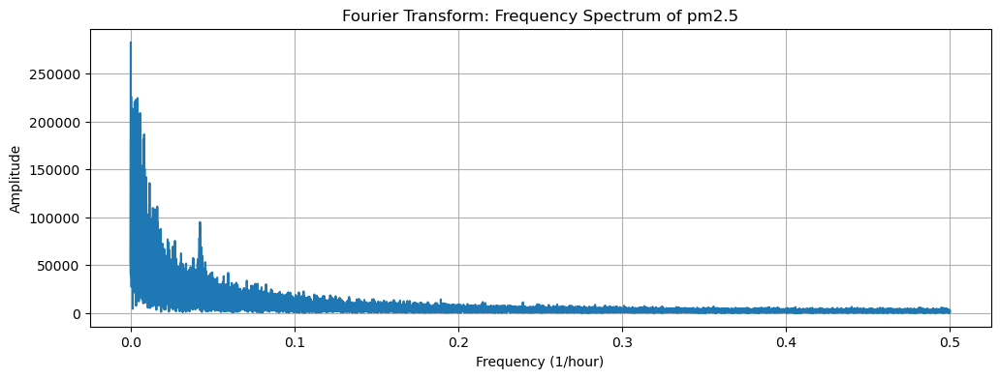

Dominant Frequency 1: 0.003175 (Period: 314.95 hours)
Dominant Frequency 2: 0.004268 (Period: 234.29 hours)
Dominant Frequency 3: 0.000338 (Period: 2955.69 hours)
Dominant Frequency 4: 0.000104 (Period: 9606.00 hours)
Dominant Frequency 5: 0.000130 (Period: 7684.80 hours)


In [41]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Drop NaNs and get values
pm_values = df['pm2.5'].dropna().values

# Apply FFT
pm_fft = np.abs(fft(pm_values))
freqs = fftfreq(len(pm_values), d=1)  # d=1 since sampling is hourly

# Only keep the positive frequencies
positive_freqs = freqs[:len(freqs)//2]
positive_fft = pm_fft[:len(pm_fft)//2]

# Plot full spectrum excluding zero frequency
plt.figure(figsize=(12, 4))
plt.plot(positive_freqs[1:], positive_fft[1:])  # exclude 0 Hz
plt.title('Fourier Transform: Frequency Spectrum of pm2.5')
plt.xlabel('Frequency (1/hour)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Identify top N dominant frequencies
N = 5
top_indices = np.argsort(positive_fft[1:])[-N:] + 1  # skip 0 freq
top_frequencies = positive_freqs[top_indices]
top_periods = 1 / top_frequencies  # convert freq to periods

# Display results
for i in range(N):
    print(f"Dominant Frequency {i+1}: {top_frequencies[i]:.6f} (Period: {top_periods[i]:.2f} hours)")


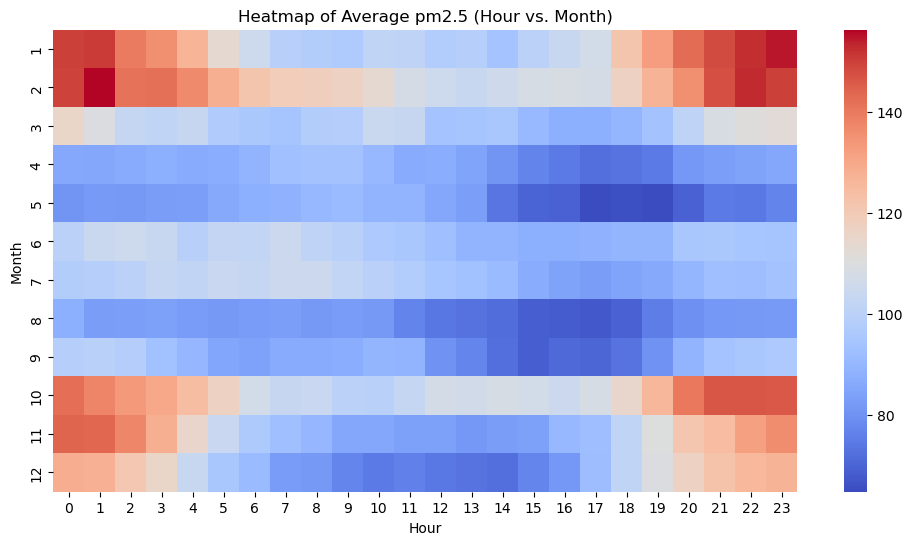

In [42]:
hour_month_avg = df.groupby([df.index.month, df.index.hour])['pm2.5'].mean().unstack()

plt.figure(figsize=(12, 6))
sns.heatmap(hour_month_avg, cmap='coolwarm')
plt.title('Heatmap of Average pm2.5 (Hour vs. Month)')
plt.xlabel('Hour')
plt.ylabel('Month')
plt.show()


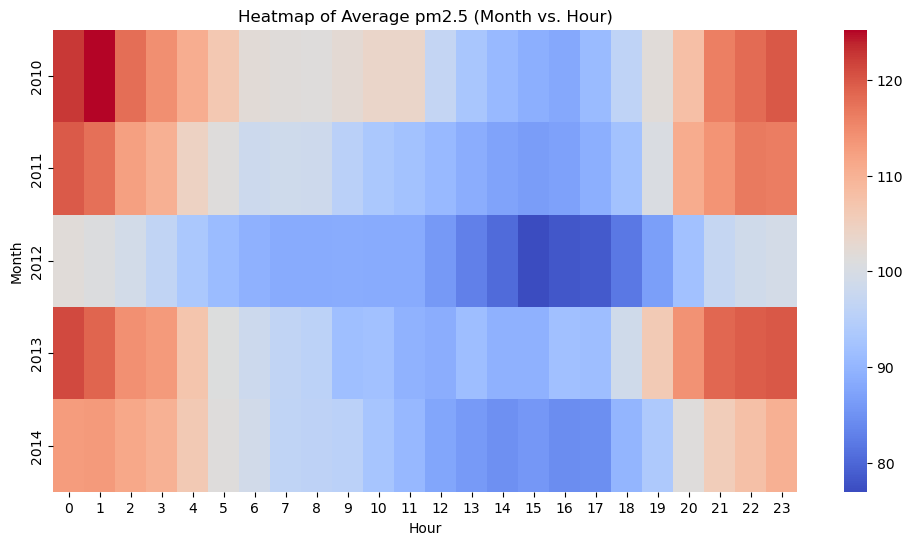

In [43]:
heatmap_1 = df.groupby([df['year'], df['hour']])['pm2.5'].mean().unstack()

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_1, cmap='coolwarm')
plt.title('Heatmap of Average pm2.5 (Month vs. Hour)')
plt.xlabel('Hour')
plt.ylabel('Month')
plt.show()



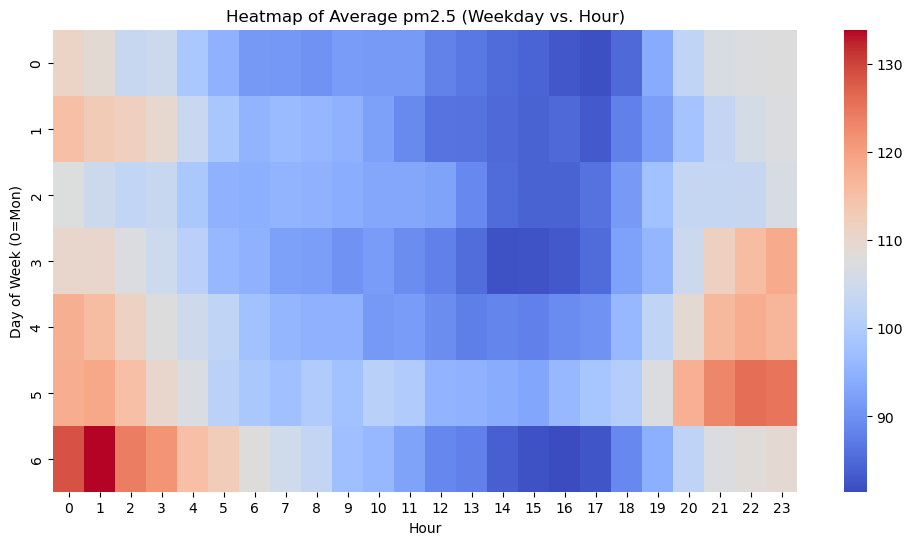

In [44]:
df['weekday'] = df.index.weekday
heatmap_2 = df.groupby([df.index.weekday, df.index.hour])['pm2.5'].mean().unstack()

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_2, cmap='coolwarm')
plt.title('Heatmap of Average pm2.5 (Weekday vs. Hour)')
plt.xlabel('Hour')
plt.ylabel('Day of Week (0=Mon)')
plt.show()


In [45]:
import numpy as np

# Encode hour of day (0–23)
df['hour_sin'] = np.sin(2 * np.pi * df.index.hour / 24)
df['hour_cos'] = np.cos(2 * np.pi * df.index.hour / 24)

# Encode day of week (0–6)
df['weekday_sin'] = np.sin(2 * np.pi * df.index.weekday / 7)
df['weekday_cos'] = np.cos(2 * np.pi * df.index.weekday / 7)

# Encode month of year (1–12)
df['month_sin'] = np.sin(2 * np.pi * df.index.month / 12)
df['month_cos'] = np.cos(2 * np.pi * df.index.month / 12)


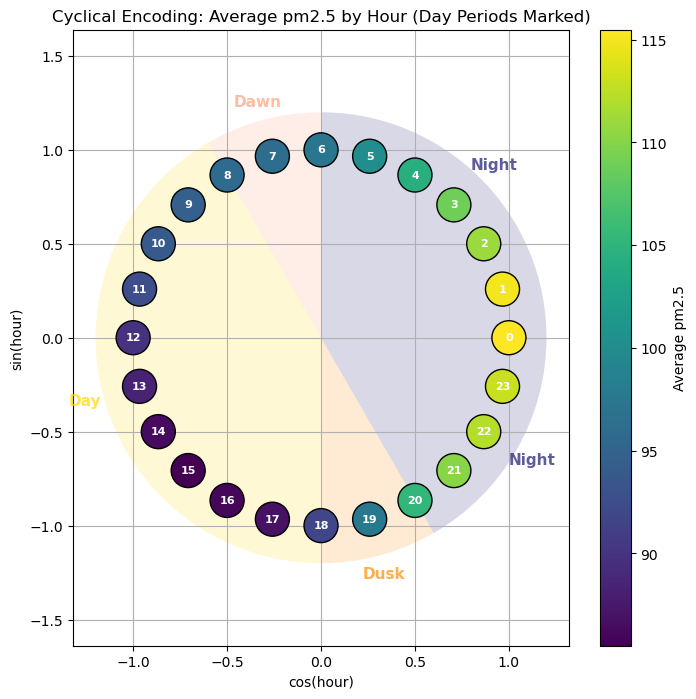

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Compute average pm2.5 for each hour
hourly_avg = df.groupby(df.index.hour)['pm2.5'].mean().reset_index()
hourly_avg.columns = ['hour', 'pm2.5']
hourly_avg['hour_sin'] = np.sin(2 * np.pi * hourly_avg['hour'] / 24)
hourly_avg['hour_cos'] = np.cos(2 * np.pi * hourly_avg['hour'] / 24)

# Define day periods: (name, start_hour, end_hour, color)
periods = [
    ('Night', 0, 5, '#191970'),
    ('Dawn', 6, 7, '#FFA07A'),
    ('Day', 8, 17, '#FFD700'),
    ('Dusk', 18, 19, '#FF8C00'),
    ('Night', 20, 23, '#191970'),
]

plt.figure(figsize=(8, 8))
ax = plt.gca()

# Add wedges for periods
for name, start, end, color in periods:
    theta1 = (start / 24) * 360
    theta2 = ((end + 1) / 24) * 360  # end+1 so last hour included
    wedge = plt.matplotlib.patches.Wedge((0, 0), 1.2, theta1, theta2, facecolor=color, alpha=0.17, lw=0, zorder=0)
    ax.add_patch(wedge)
    # Add label for period at its mid-angle
    mid_angle = (theta1 + theta2) / 2
    x = 1.3 * np.cos(np.deg2rad(mid_angle))
    y = 1.3 * np.sin(np.deg2rad(mid_angle))
    ax.text(x, y, name, ha='center', va='center', fontsize=11, color=color, fontweight='bold', alpha=0.7)

# Plot points
sc = plt.scatter(hourly_avg['hour_cos'], hourly_avg['hour_sin'],
                 c=hourly_avg['pm2.5'], cmap='viridis', s=600, edgecolor='k', zorder=10)
for i, row in hourly_avg.iterrows():
    plt.text(row['hour_cos'], row['hour_sin'], str(int(row['hour'])),
             color='white', ha='center', va='center', fontsize=8, fontweight='bold', zorder=20)

plt.title('Cyclical Encoding: Average pm2.5 by Hour (Day Periods Marked)')
plt.xlabel('cos(hour)')
plt.ylabel('sin(hour)')
plt.axis('equal')
plt.grid(True)
plt.colorbar(sc, label='Average pm2.5')
plt.show()


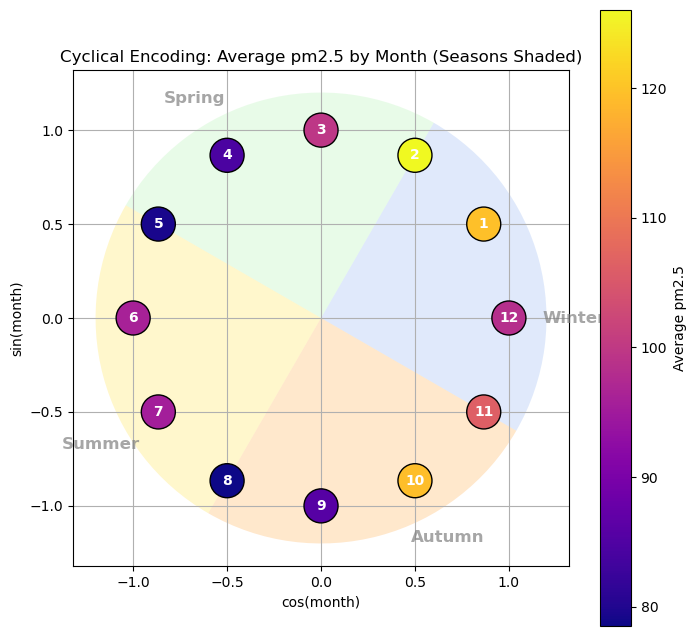

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge

# Compute average pm2.5 for each month
monthly_avg = df.groupby(df.index.month)['pm2.5'].mean().reset_index()
monthly_avg.columns = ['month', 'pm2.5']
monthly_avg['month_sin'] = np.sin(2 * np.pi * monthly_avg['month'] / 12)
monthly_avg['month_cos'] = np.cos(2 * np.pi * monthly_avg['month'] / 12)

fig, ax = plt.subplots(figsize=(8, 8))

# Define season wedges (in degrees)
seasons = [
    ('Winter', 330, 60, '#6495ED'),    # Dec, Jan, Feb
    ('Spring', 60, 150, '#90EE90'),    # Mar, Apr, May
    ('Summer', 150, 240, '#FFD700'),   # Jun, Jul, Aug
    ('Autumn', 240, 330, '#FF8C00'),   # Sep, Oct, Nov
]
for season, theta1, theta2, color in seasons:
    wedge = Wedge((0, 0), 1.2, theta1, theta2, facecolor=color, alpha=0.2, lw=0)
    ax.add_patch(wedge)

# Plot average pm2.5
sc = ax.scatter(monthly_avg['month_cos'], monthly_avg['month_sin'],
                c=monthly_avg['pm2.5'], cmap='plasma', s=600, edgecolor='k', zorder=10)
for i, row in monthly_avg.iterrows():
    ax.text(row['month_cos'], row['month_sin'], str(int(row['month'])),
            color='white', ha='center', va='center', fontsize=10, fontweight='bold', zorder=20)

ax.set_title('Cyclical Encoding: Average pm2.5 by Month (Seasons Shaded)')
ax.set_xlabel('cos(month)')
ax.set_ylabel('sin(month)')
ax.set_aspect('equal')
ax.grid(True)
fig.colorbar(sc, label='Average pm2.5')

# Optionally add season labels
season_labels = ['Winter', 'Spring', 'Summer', 'Autumn']
season_angles = [0, 120, 210, 300]
for label, angle in zip(season_labels, season_angles):
    ax.text(1.35 * np.cos(np.deg2rad(angle)), 1.35 * np.sin(np.deg2rad(angle)), label,
            ha='center', va='center', fontsize=12, fontweight='bold', color='gray', alpha=0.7)

plt.show()


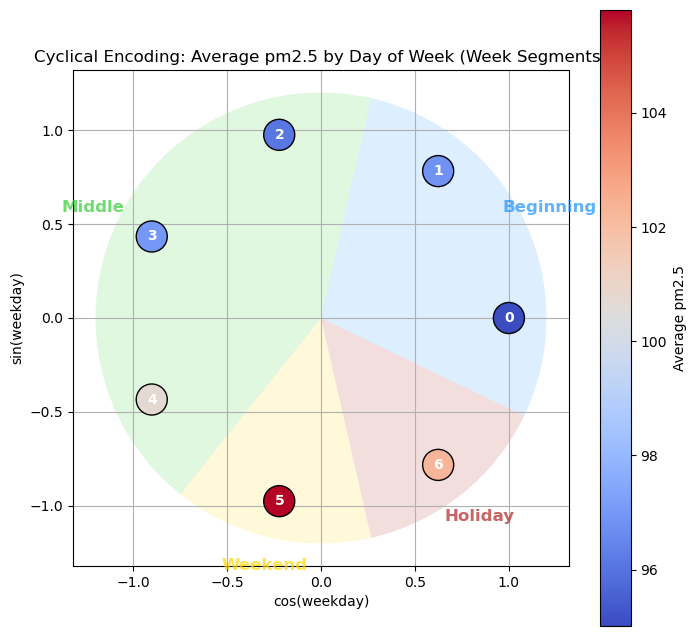

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Compute average pm2.5 for each weekday (0=Monday)
weekday_avg = df.groupby(df.index.weekday)['pm2.5'].mean().reset_index()
weekday_avg.columns = ['weekday', 'pm2.5']
weekday_avg['weekday_sin'] = np.sin(2 * np.pi * weekday_avg['weekday'] / 7)
weekday_avg['weekday_cos'] = np.cos(2 * np.pi * weekday_avg['weekday'] / 7)

# Define week sections (adjust these as needed for your calendar)
sections = [
    ('Holiday', 6, 6, '#B22222'),         # Sunday (6)
    ('Beginning', 0, 1, '#1E90FF'),       # Monday, Tuesday (0,1)
    ('Middle', 2, 4, '#32CD32'),          # Wednesday, Thursday, Friday (2,3,4)
    ('Weekend', 5, 5, '#FFD700'),         # Saturday (5)
]

width_deg = 360 / 7


fig, ax = plt.subplots(figsize=(8, 8))
# Draw colored wedges
for name, start, end, color in sections:
    # For each section, cover all days in that section
    theta1 = (start * width_deg) - (width_deg / 2)
    theta2 = ((end + 1) * width_deg) - (width_deg / 2)
    wedge = plt.matplotlib.patches.Wedge((0, 0), 1.2, theta1, theta2, facecolor=color, alpha=0.15, lw=0)
    ax.add_patch(wedge)
    # Label at center angle
    mid_angle = (theta1 + theta2) / 2
    x = 1.35 * np.cos(np.deg2rad(mid_angle))
    y = 1.35 * np.sin(np.deg2rad(mid_angle))
    ax.text(x, y, name, ha='center', va='center', fontsize=12, fontweight='bold', color=color, alpha=0.7)

# Scatter plot of average pm2.5
sc = ax.scatter(weekday_avg['weekday_cos'], weekday_avg['weekday_sin'],
                c=weekday_avg['pm2.5'], cmap='coolwarm', s=500, edgecolor='k', zorder=10)
for i, row in weekday_avg.iterrows():
    ax.text(row['weekday_cos'], row['weekday_sin'], str(int(row['weekday'])),
            color='white', ha='center', va='center', fontsize=10, fontweight='bold', zorder=20)

ax.set_title('Cyclical Encoding: Average pm2.5 by Day of Week (Week Segments)')
ax.set_xlabel('cos(weekday)')
ax.set_ylabel('sin(weekday)')
ax.set_aspect('equal')
ax.grid(True)
fig.colorbar(sc, label='Average pm2.5')
plt.show()


### Advanced Time features

In [49]:
# Assign seasons by month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['season'] = df.index.month.map(get_season)

# Encode seasons as numbers for cyclical encoding (Winter=0, Spring=1, Summer=2, Autumn=3)
season_to_num = {'Winter': 0, 'Spring': 1, 'Summer': 2, 'Autumn': 3}
df['season_num'] = df['season'].map(season_to_num)

# Sine and cosine encoding for seasons (period=4)
df['season_sin'] = np.sin(2 * np.pi * df['season_num'] / 4)
df['season_cos'] = np.cos(2 * np.pi * df['season_num'] / 4)


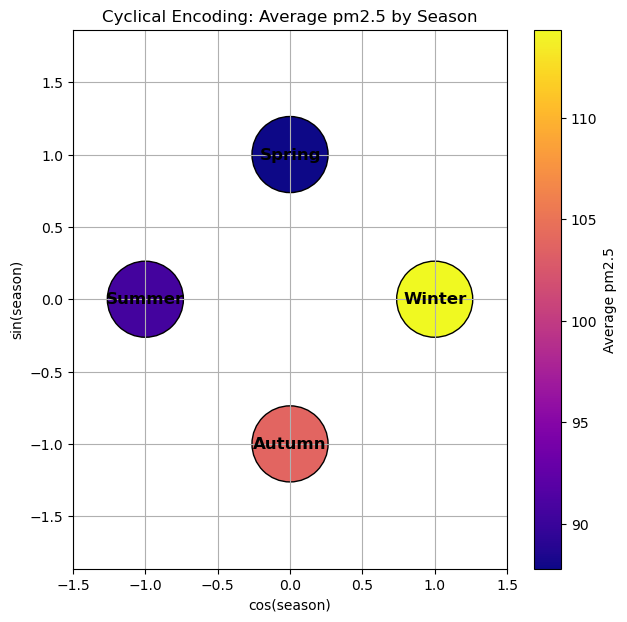

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# Average pm2.5 for each season
season_avg = df.groupby('season_num')['pm2.5'].mean().reset_index()
season_names = ['Winter', 'Spring', 'Summer', 'Autumn']
season_avg['season'] = [season_names[num] for num in season_avg['season_num']]
season_avg['season_sin'] = np.sin(2 * np.pi * season_avg['season_num'] / 4)
season_avg['season_cos'] = np.cos(2 * np.pi * season_avg['season_num'] / 4)

plt.figure(figsize=(7,7))
sc = plt.scatter(season_avg['season_cos'], season_avg['season_sin'],
                 c=season_avg['pm2.5'], cmap='plasma', s=3000, edgecolor='k')

for i, row in season_avg.iterrows():
    plt.text(row['season_cos'], row['season_sin'], row['season'],
             color='black', ha='center', va='center', fontsize=12, fontweight='bold')

plt.title('Cyclical Encoding: Average pm2.5 by Season')
plt.xlabel('cos(season)')
plt.ylabel('sin(season)')
plt.axis('equal')
plt.grid(True)
plt.colorbar(sc, label='Average pm2.5')
plt.xlim(-1.5, 1.5)
plt.show()


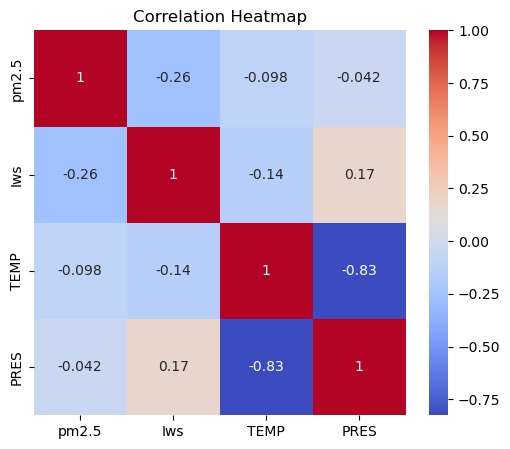

In [51]:
corr_cols = ['pm2.5', 'Iws', 'TEMP', 'PRES']
corr = df[corr_cols].corr()
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


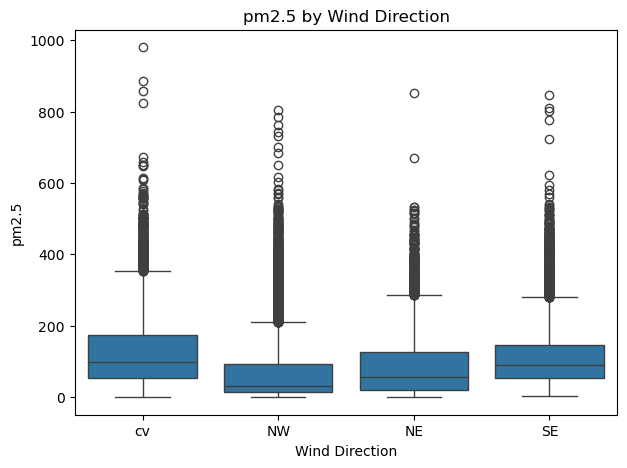

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Map cbwd_* back to wind direction label for boxplot
wind_dir_map = { 'cbwd_NE': 'NE', 'cbwd_NW': 'NW', 'cbwd_SE': 'SE', 'cbwd_cv': 'cv' }
df['cbwd_label'] = df[['cbwd_NE', 'cbwd_NW', 'cbwd_SE', 'cbwd_cv']].idxmax(axis=1).map(wind_dir_map)

plt.figure(figsize=(7, 5))
sns.boxplot(x='cbwd_label', y='pm2.5', data=df)
plt.title('pm2.5 by Wind Direction')
plt.xlabel('Wind Direction')
plt.ylabel('pm2.5')
plt.show()


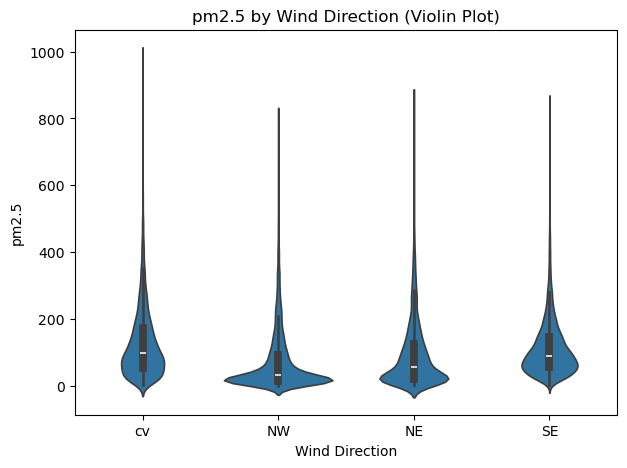

In [53]:
# Regression scatter plots with regression line
import matplotlib.pyplot as plt
import seaborn as sns

# Violin plot for wind direction
# Map cbwd_* back to wind direction label for violin plot
wind_dir_map = { 'cbwd_NE': 'NE', 'cbwd_NW': 'NW', 'cbwd_SE': 'SE', 'cbwd_cv': 'cv' }
df['cbwd_label'] = df[['cbwd_NE', 'cbwd_NW', 'cbwd_SE', 'cbwd_cv']].idxmax(axis=1).map(wind_dir_map)

plt.figure(figsize=(7, 5))
sns.violinplot(x='cbwd_label', y='pm2.5', data=df)
plt.title('pm2.5 by Wind Direction (Violin Plot)')
plt.xlabel('Wind Direction')
plt.ylabel('pm2.5')
plt.show()


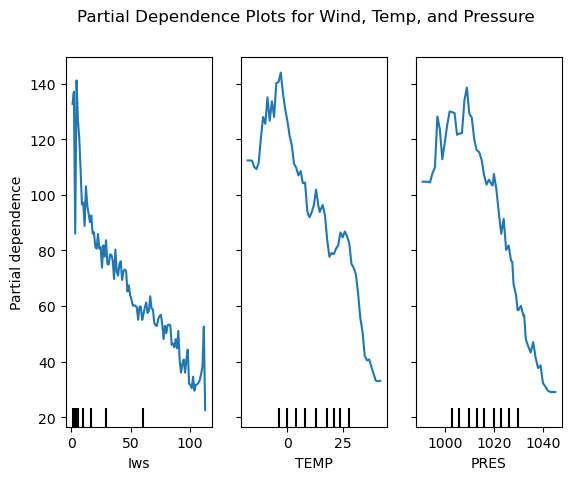

In [54]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import partial_dependence, PartialDependenceDisplay

features = ['Iws', 'TEMP', 'PRES']
X = df[features].fillna(0)  # Or use your best fill method
y = df['pm2.5']

rf = RandomForestRegressor(n_estimators=50, random_state=0)
rf.fit(X, y)

PartialDependenceDisplay.from_estimator(rf, X, features, kind='average')
plt.suptitle('Partial Dependence Plots for Wind, Temp, and Pressure')
plt.show()


## Q1.2.8 
(Already embeded in the previous section)

## Q1.2.9

In [109]:
df.columns

Index(['year', 'month', 'day', 'hour', 'pm2.5', 'DEWP', 'TEMP', 'PRES', 'Iws',
       'Is', 'Ir', 'pm2.5_lag1', 'pm2.5_lag2', 'pm2.5_lag3', 'pm2.5_lag24',
       'pm2.5_lag168', 'cbwd_NE', 'cbwd_NW', 'cbwd_SE', 'cbwd_cv',
       'AQI_Category', 'pm2.5_roll_mean_24h', 'pm2.5_roll_std_24h',
       'pm2.5_roll_var_24h', 'pm2.5_roll_min_24h', 'pm2.5_roll_max_24h',
       'pm2.5_roll_median_24h', 'pm2.5_roll_skew_24h', 'pm2.5_roll_kurt_24h',
       'weekday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos',
       'month_sin', 'month_cos', 'season', 'season_num', 'season_sin',
       'season_cos', 'cbwd_label'],
      dtype='object')

In [56]:
print(df['AQI_Category'].value_counts())



AQI_Category
Unhealthy                         14388
Moderate                           7956
Very Unhealthy                     5462
Unhealthy for Sensitive Groups     4601
Good                               3145
Hazardous                          2755
Extreme                             117
Name: count, dtype: int64


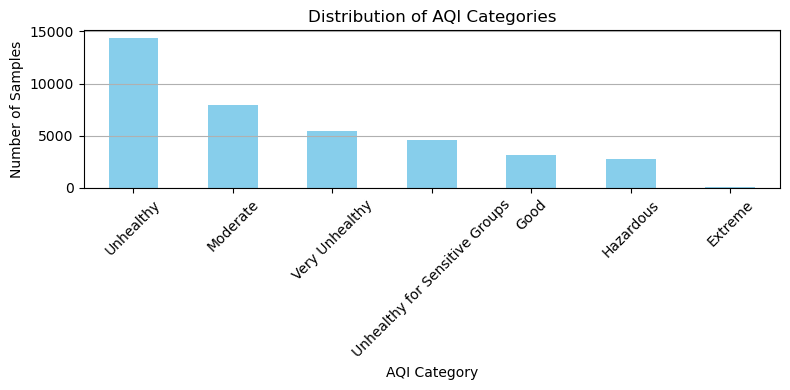

In [57]:
import matplotlib.pyplot as plt

counts = df['AQI_Category'].value_counts()
plt.figure(figsize=(8, 4))
counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of AQI Categories')
plt.xlabel('AQI Category')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [58]:
from sklearn.utils import resample
import pandas as pd

# Find the max class size
max_size = df['AQI_Category'].value_counts().max()

# Resample each class to max_size
df_balanced = pd.concat([
    resample(
        group,
        replace=True,                # sample with replacement
        n_samples=max_size,          # to match majority class size
        random_state=42
    )
    for _, group in df.groupby('AQI_Category')
], ignore_index=True)

# Shuffle the resulting dataframe
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)


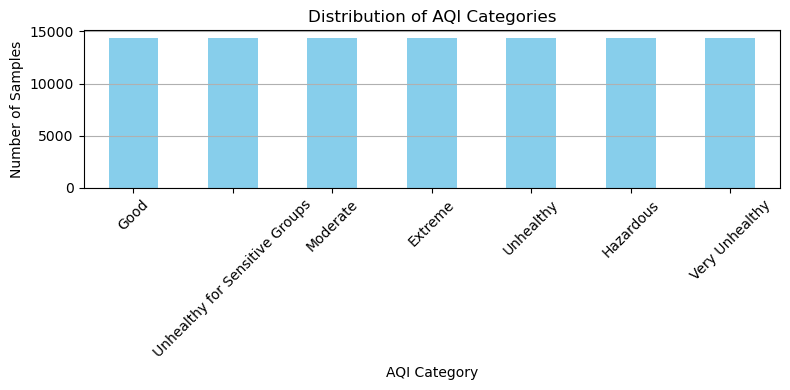

In [59]:
import matplotlib.pyplot as plt

counts = df_balanced['AQI_Category'].value_counts()
plt.figure(figsize=(8, 4))
counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of AQI Categories')
plt.xlabel('AQI Category')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [60]:
df_balanced.columns

Index(['year', 'month', 'day', 'hour', 'pm2.5', 'DEWP', 'TEMP', 'PRES', 'Iws',
       'Is', 'Ir', 'pm2.5_lag1', 'pm2.5_lag2', 'pm2.5_lag3', 'pm2.5_lag24',
       'pm2.5_lag168', 'cbwd_NE', 'cbwd_NW', 'cbwd_SE', 'cbwd_cv',
       'AQI_Category', 'pm2.5_roll_mean_24h', 'pm2.5_roll_std_24h',
       'pm2.5_roll_var_24h', 'pm2.5_roll_min_24h', 'pm2.5_roll_max_24h',
       'pm2.5_roll_median_24h', 'pm2.5_roll_skew_24h', 'pm2.5_roll_kurt_24h',
       'weekday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos',
       'month_sin', 'month_cos', 'season', 'season_num', 'season_sin',
       'season_cos', 'cbwd_label'],
      dtype='object')

In [110]:
df.columns

Index(['year', 'month', 'day', 'hour', 'pm2.5', 'DEWP', 'TEMP', 'PRES', 'Iws',
       'Is', 'Ir', 'pm2.5_lag1', 'pm2.5_lag2', 'pm2.5_lag3', 'pm2.5_lag24',
       'pm2.5_lag168', 'cbwd_NE', 'cbwd_NW', 'cbwd_SE', 'cbwd_cv',
       'AQI_Category', 'pm2.5_roll_mean_24h', 'pm2.5_roll_std_24h',
       'pm2.5_roll_var_24h', 'pm2.5_roll_min_24h', 'pm2.5_roll_max_24h',
       'pm2.5_roll_median_24h', 'pm2.5_roll_skew_24h', 'pm2.5_roll_kurt_24h',
       'weekday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos',
       'month_sin', 'month_cos', 'season', 'season_num', 'season_sin',
       'season_cos', 'cbwd_label'],
      dtype='object')

## Q1.2.10

In [61]:
# Columns to drop
cols_to_drop = [
    'year', 'month', 'day', 'hour',           # redundant
    'pm2.5',                                  # target
    'AQI_Category',                           # target for classification
    'weekday',                                # redundant (have cyclical)
    'season', 'season_num',                   # string/categorical, have cyclical
    'cbwd_label'                              # string, for plots
]

X = df_balanced.drop(columns=cols_to_drop, errors='ignore')
y = df_balanced['AQI_Category']
y_reg = df_balanced['pm2.5']  # or 'pm2.5' for regression

# Normalize only numeric columns
from sklearn.preprocessing import StandardScaler
numeric_cols = X.select_dtypes(include=['float64', 'int64']).columns
scaler = StandardScaler()
X_scaled = X.copy()
X_scaled[numeric_cols] = scaler.fit_transform(X[numeric_cols])


Light GBM feature selection

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3885
[LightGBM] [Info] Number of data points in the train set: 80572, number of used features: 31
[LightGBM] [Info] Start training from score -1.945848
[LightGBM] [Info] Start training from score -1.945848
[LightGBM] [Info] Start training from score -1.945935
[LightGBM] [Info] Start training from score -1.945935
[LightGBM] [Info] Start training from score -1.945935
[LightGBM] [Info] Start training from score -1.945935
[LightGBM] [Info] Start training from score -1.945935


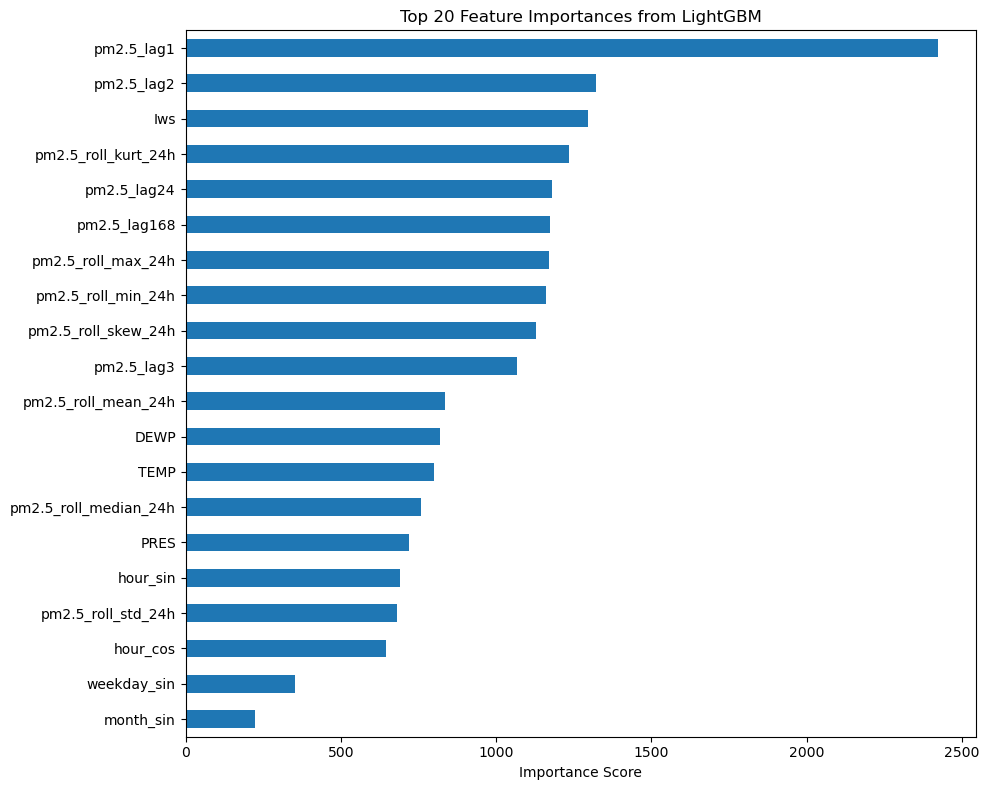

In [62]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd

# Prepare X, y (assuming you did StandardScaler as above)
# For classification (AQI_Category):
from sklearn.preprocessing import LabelEncoder

X = X_scaled  # from your previous prep
y = df_balanced['AQI_Category']

# Encode the target for LightGBM classification
le = LabelEncoder()
y_enc = le.fit_transform(y)

# Split data
X_train, X_valid, y_train, y_valid = train_test_split(X, y_enc, test_size=0.2, random_state=42, stratify=y_enc)

# Train LightGBM model
lgbm = lgb.LGBMClassifier(random_state=42)
lgbm.fit(X_train, y_train)

# Get feature importances
importances = pd.Series(lgbm.feature_importances_, index=X.columns).sort_values(ascending=False)

# Plot
plt.figure(figsize=(10, 8))
importances.head(20).plot(kind='barh')
plt.title('Top 20 Feature Importances from LightGBM')
plt.xlabel('Importance Score')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [63]:
# Get top 10 features by importance
top_10_features = importances.head(10).index.tolist()

# Keep only these features
X_selected = X_scaled[top_10_features]

In [64]:
# Ensure X_selected and y have the same index
X_selected_clean = X_selected.dropna()
y_clean = y.loc[X_selected_clean.index]


In [65]:
len(y_clean)

100708

## Q1.2.11 Train test split

In [66]:
from sklearn.model_selection import train_test_split

# Step 1: Split 15% test from full clean set
X_temp, X_test, y_temp, y_test = train_test_split(
    X_selected_clean, y_clean,
    test_size=0.15,
    random_state=42,
    stratify=y_clean  # <- use y_clean here
)

# Step 2: Split 15% validation from remaining 85%
# 70% of total is ≈ 0.8235 of 85%
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp,
    test_size=0.1765,
    random_state=42,
    stratify=y_temp
)


## Q1.2.12


--- Training SVM (rbf) ---

RBF - Train:
                                precision    recall  f1-score   support

                       Extreme       0.97      1.00      0.98     10071
                          Good       0.76      0.89      0.82     10071
                     Hazardous       0.91      0.90      0.91     10071
                      Moderate       0.70      0.58      0.63     10071
                     Unhealthy       0.83      0.72      0.77     10071
Unhealthy for Sensitive Groups       0.71      0.77      0.74     10071
                Very Unhealthy       0.83      0.86      0.85     10066

                      accuracy                           0.82     70492
                     macro avg       0.82      0.82      0.81     70492
                  weighted avg       0.82      0.82      0.81     70492


RBF - Validation:
                                precision    recall  f1-score   support

                       Extreme       0.97      1.00      0.98      2159

<Figure size 600x500 with 0 Axes>

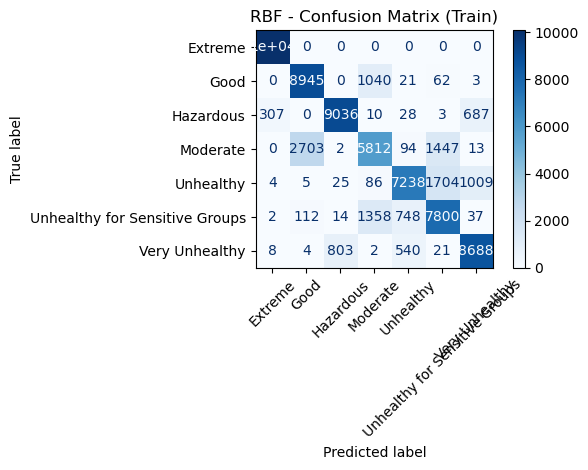

<Figure size 600x500 with 0 Axes>

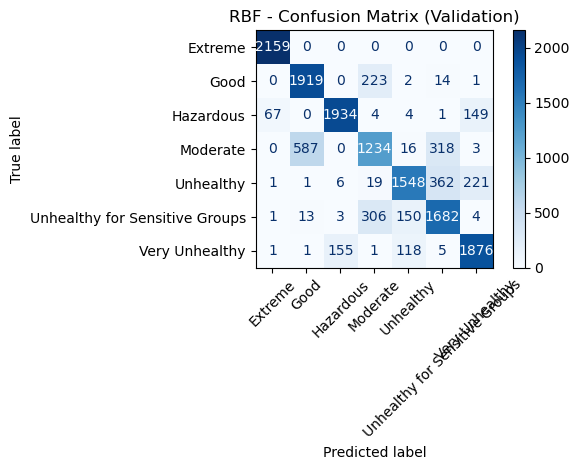

<Figure size 600x500 with 0 Axes>

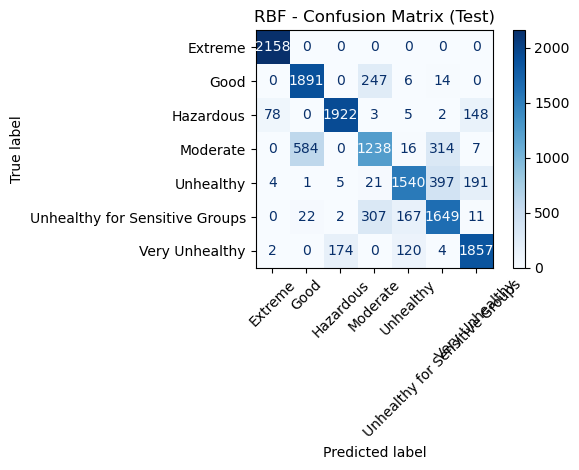


--- Training SVM (poly) ---

POLY - Train:
                                precision    recall  f1-score   support

                       Extreme       0.97      1.00      0.98     10071
                          Good       0.76      0.87      0.81     10071
                     Hazardous       0.93      0.79      0.85     10071
                      Moderate       0.68      0.54      0.60     10071
                     Unhealthy       0.77      0.61      0.68     10071
Unhealthy for Sensitive Groups       0.68      0.73      0.70     10071
                Very Unhealthy       0.68      0.90      0.77     10066

                      accuracy                           0.78     70492
                     macro avg       0.78      0.78      0.77     70492
                  weighted avg       0.78      0.78      0.77     70492


POLY - Validation:
                                precision    recall  f1-score   support

                       Extreme       0.97      1.00      0.98      2

<Figure size 600x500 with 0 Axes>

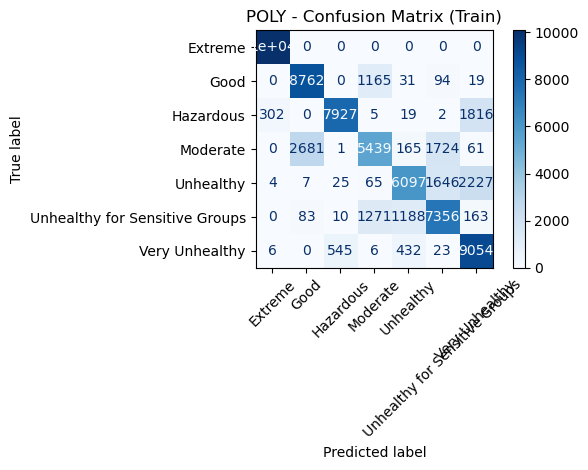

<Figure size 600x500 with 0 Axes>

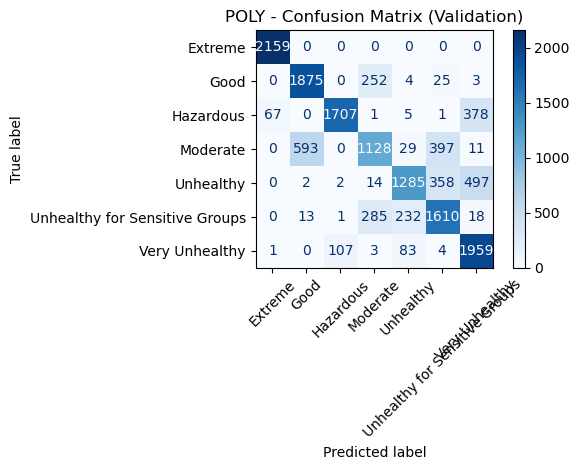

<Figure size 600x500 with 0 Axes>

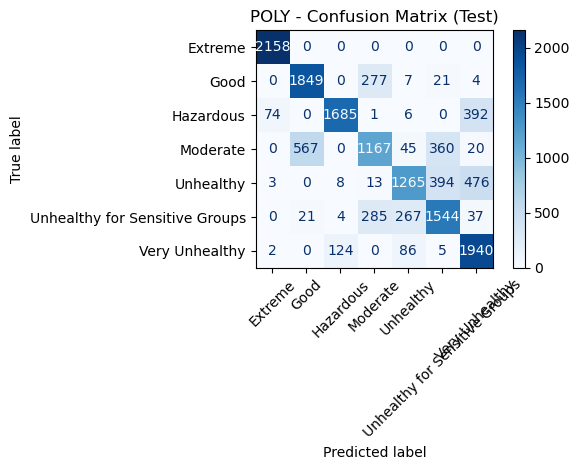


--- Training SVM (linear) ---

LINEAR - Train:
                                precision    recall  f1-score   support

                       Extreme       0.93      0.98      0.95     10071
                          Good       0.79      0.89      0.84     10071
                     Hazardous       0.89      0.85      0.87     10071
                      Moderate       0.71      0.61      0.66     10071
                     Unhealthy       0.82      0.73      0.77     10071
Unhealthy for Sensitive Groups       0.71      0.77      0.74     10071
                Very Unhealthy       0.83      0.85      0.84     10066

                      accuracy                           0.81     70492
                     macro avg       0.81      0.81      0.81     70492
                  weighted avg       0.81      0.81      0.81     70492


LINEAR - Validation:
                                precision    recall  f1-score   support

                       Extreme       0.93      0.98      0.95 

<Figure size 600x500 with 0 Axes>

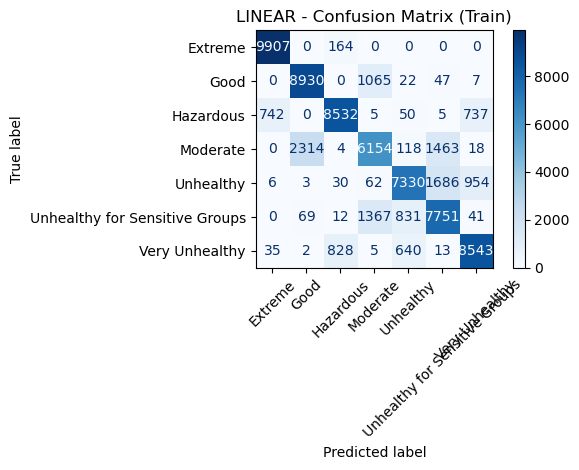

<Figure size 600x500 with 0 Axes>

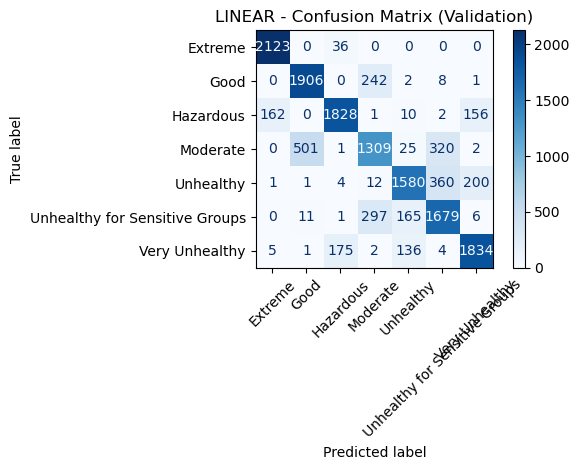

<Figure size 600x500 with 0 Axes>

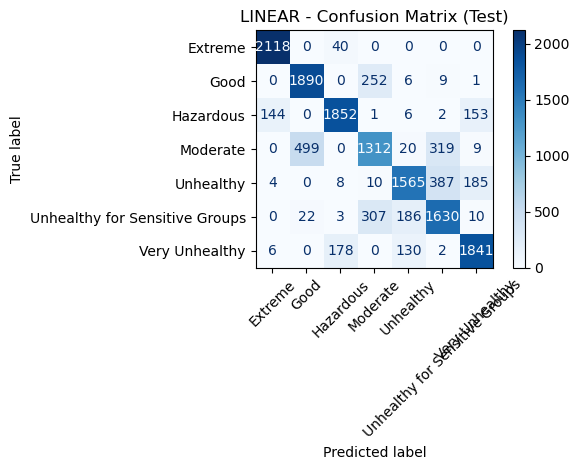

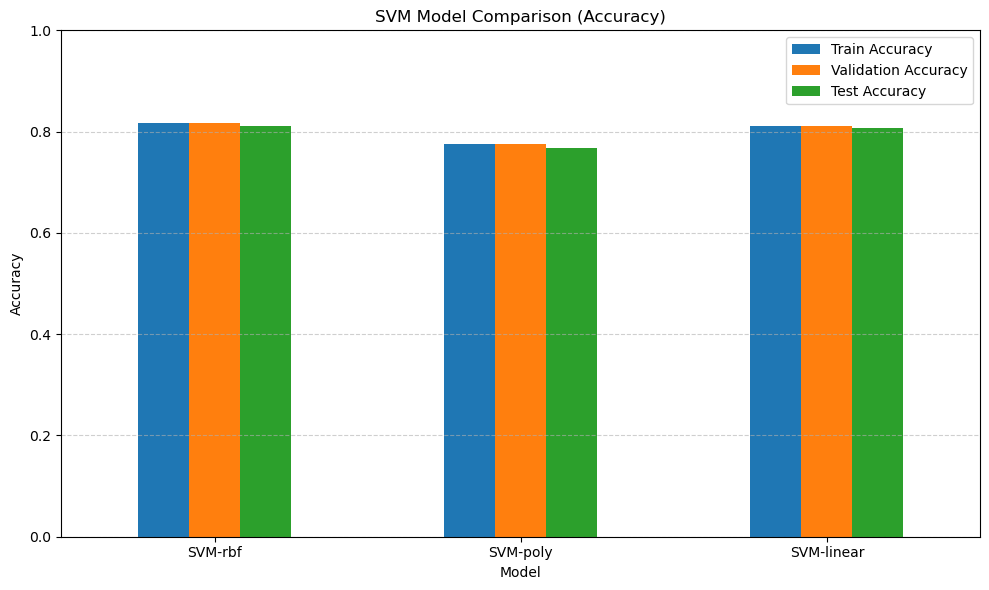

In [68]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

kernels = {
    'rbf': SVC(kernel='rbf', random_state=42),
    'poly': SVC(kernel='poly', degree=3, random_state=42),
    'linear': SVC(kernel='linear', random_state=42)
}

# Store accuracies for comparison later
comparison_results = []

for name, model in kernels.items():
    print(f"\n--- Training SVM ({name}) ---")
    model.fit(X_train, y_train)

    # Predict
    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)
    y_pred_test = model.predict(X_test)

    # Classification reports
    print(f"\n{name.upper()} - Train:\n{classification_report(y_train, y_pred_train, target_names=le.classes_)}")
    print(f"\n{name.upper()} - Validation:\n{classification_report(y_val, y_pred_val, target_names=le.classes_)}")
    print(f"\n{name.upper()} - Test:\n{classification_report(y_test, y_pred_test, target_names=le.classes_)}")

    # Collect accuracy scores
    comparison_results.append({
        "Model": f"SVM-{name}",
        "Train Accuracy": accuracy_score(y_train, y_pred_train),
        "Validation Accuracy": accuracy_score(y_val, y_pred_val),
        "Test Accuracy": accuracy_score(y_test, y_pred_test)
    })

    # Plot confusion matrices in notebook
    for split_name, y_true, y_pred in zip(
        ['Train', 'Validation', 'Test'],
        [y_train, y_val, y_test],
        [y_pred_train, y_pred_val, y_pred_test]
    ):
        plt.figure(figsize=(6, 5))
        ConfusionMatrixDisplay.from_predictions(
            y_true, y_pred, display_labels=le.classes_,
            cmap='Blues', xticks_rotation=45
        )
        plt.title(f'{name.upper()} - Confusion Matrix ({split_name})')
        plt.tight_layout()
        plt.show()

# Create comparison bar plot
import pandas as pd

comp_df = pd.DataFrame(comparison_results)
comp_df.set_index("Model", inplace=True)
comp_df.plot(kind='bar', figsize=(10, 6), ylim=(0, 1), title='SVM Model Comparison (Accuracy)')
plt.ylabel("Accuracy")
plt.xticks(rotation=0)
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Scratch codes


In [68]:
import numpy as np
from tqdm import tqdm

class LinearSVM:
    def __init__(self, learning_rate=0.001, lambda_param=0.01, n_iters=1000):
        self.lr = learning_rate
        self.lambda_param = lambda_param
        self.n_iters = n_iters

    def fit(self, X, y):
        # Convert labels to -1 or 1
        y_ = np.where(y <= 0, -1, 1)
        n_samples, n_features = X.shape

        self.w = np.zeros(n_features)
        self.b = 0

        for _ in tqdm(range(self.n_iters), desc="Training Linear SVM"):
            for idx, x_i in enumerate(X):
                condition = y_[idx] * (np.dot(x_i, self.w) + self.b) >= 1
                if condition:
                    self.w -= self.lr * (2 * self.lambda_param * self.w)
                else:
                    self.w -= self.lr * (2 * self.lambda_param * self.w - y_[idx] * x_i)
                    self.b -= self.lr * y_[idx]

    def decision_function(self, X):
        return np.dot(X, self.w) + self.b

    def predict(self, X):
        return np.sign(self.decision_function(X))


In [69]:
class OneVsRestSVM:
    def __init__(self, base_model_class, **kwargs):
        self.base_model_class = base_model_class
        self.model_kwargs = kwargs
        self.models = {}
        self.classes_ = []

    def fit(self, X, y):
        self.classes_ = np.unique(y)
        for cls in tqdm(self.classes_, desc="OvR Training"):
            y_binary = np.where(y == cls, 1, 0)
            model = self.base_model_class(**self.model_kwargs)
            model.fit(X, y_binary)
            self.models[cls] = model

    def predict(self, X):
        # Compute raw scores from each model
        scores = np.column_stack([
            model.decision_function(X) for model in self.models.values()
        ])
        preds = np.argmax(scores, axis=1)
        return self.classes_[preds]


OvR Training:   0%|          | 0/7 [00:00<?, ?it/s]

OvR Training: 100%|██████████| 7/7 [18:53<00:00, 161.89s/it]



LINEAR SVM - Train:
                                 precision    recall  f1-score   support

                       Extreme       0.42      0.99      0.59     10071
                          Good       0.38      0.82      0.52     10071
                     Hazardous       0.06      0.00      0.01     10071
                      Moderate       0.28      0.21      0.24     10071
                     Unhealthy       0.35      0.04      0.07     10071
Unhealthy for Sensitive Groups       0.25      0.29      0.27     10071
                Very Unhealthy       0.72      0.25      0.37     10066

                      accuracy                           0.37     70492
                     macro avg       0.35      0.37      0.29     70492
                  weighted avg       0.35      0.37      0.29     70492


LINEAR SVM - Validation:
                                 precision    recall  f1-score   support

                       Extreme       0.42      0.99      0.59      2159
           

<Figure size 700x500 with 0 Axes>

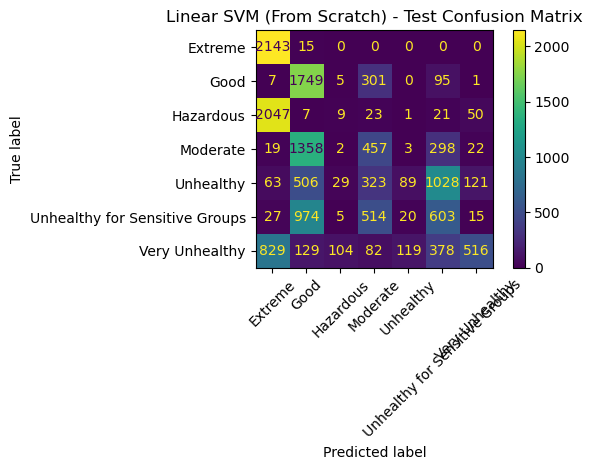

In [71]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from tqdm import tqdm

# Convert to NumPy float arrays for compatibility with SVM from scratch
X_train_np = X_train.to_numpy().astype(float)
X_val_np = X_val.to_numpy().astype(float)
X_test_np = X_test.to_numpy().astype(float)

# Encode labels
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# Train Linear SVM using One-vs-Rest
linear_ovr = OneVsRestSVM(LinearSVM, learning_rate=0.001, lambda_param=0.01, n_iters=500)
linear_ovr.fit(X_train_np, y_train_enc)

# Predict
y_pred_train = linear_ovr.predict(X_train_np)
y_pred_val = linear_ovr.predict(X_val_np)
y_pred_test = linear_ovr.predict(X_test_np)

# Decode predictions
y_train_dec = le.inverse_transform(y_pred_train)
y_val_dec = le.inverse_transform(y_pred_val)
y_test_dec = le.inverse_transform(y_pred_test)

# Reports
print("\nLINEAR SVM - Train:\n", classification_report(y_train, y_train_dec, target_names=le.classes_))
print("\nLINEAR SVM - Validation:\n", classification_report(y_val, y_val_dec, target_names=le.classes_))
print("\nLINEAR SVM - Test:\n", classification_report(y_test, y_test_dec, target_names=le.classes_))

# Confusion Matrix
plt.figure(figsize=(7, 5))
ConfusionMatrixDisplay.from_predictions(y_test, y_test_dec, display_labels=le.classes_, xticks_rotation=45)
plt.title("Linear SVM (From Scratch) - Test Confusion Matrix")
plt.tight_layout()
plt.show()


In [73]:
from sklearn.metrics import accuracy_score
import numpy as np
from tqdm import tqdm

# Sample a subset of training data for faster tuning
sample_size = 5000  # Feel free to adjust
np.random.seed(42)
sample_idx = np.random.choice(len(X_train_np), size=sample_size, replace=False)
X_sample = X_train_np[sample_idx]
y_sample = y_train_enc[sample_idx]

# Grid search space (keep n_iters fixed)
learning_rates = [0.001, 0.0005, 0.0001]
lambda_params = [0.01, 0.05, 0.1]
n_iters_fixed = 500

best_score = 0
best_params = {}
results = []

print("\n🔍 Starting Grid Search on Sampled Data...\n")
for lr in learning_rates:
    for lp in lambda_params:
        print(f"➡️ Trying: learning_rate={lr}, lambda_param={lp}")
        model = OneVsRestSVM(
            LinearSVM,
            learning_rate=lr,
            lambda_param=lp,
            n_iters=n_iters_fixed
        )
        model.fit(X_sample, y_sample)
        preds = model.predict(X_val_np)
        acc = accuracy_score(y_val_enc, preds)

        results.append({
            'learning_rate': lr,
            'lambda_param': lp,
            'accuracy': acc
        })

        if acc > best_score:
            best_score = acc
            best_params = {
                'learning_rate': lr,
                'lambda_param': lp,
                'n_iters': n_iters_fixed
            }

print("\n✅ Best Parameters Found:", best_params)
print(f"✅ Validation Accuracy: {best_score:.4f}")



🔍 Starting Grid Search on Sampled Data...

➡️ Trying: learning_rate=0.001, lambda_param=0.01


OvR Training: 100%|██████████| 7/7 [01:23<00:00, 11.92s/it]


➡️ Trying: learning_rate=0.001, lambda_param=0.05


OvR Training: 100%|██████████| 7/7 [01:22<00:00, 11.72s/it]


➡️ Trying: learning_rate=0.001, lambda_param=0.1


OvR Training: 100%|██████████| 7/7 [01:21<00:00, 11.69s/it]


➡️ Trying: learning_rate=0.0005, lambda_param=0.01


OvR Training: 100%|██████████| 7/7 [01:21<00:00, 11.69s/it]


➡️ Trying: learning_rate=0.0005, lambda_param=0.05


OvR Training: 100%|██████████| 7/7 [01:21<00:00, 11.63s/it]


➡️ Trying: learning_rate=0.0005, lambda_param=0.1


OvR Training: 100%|██████████| 7/7 [01:22<00:00, 11.82s/it]


➡️ Trying: learning_rate=0.0001, lambda_param=0.01


OvR Training: 100%|██████████| 7/7 [01:22<00:00, 11.72s/it]


➡️ Trying: learning_rate=0.0001, lambda_param=0.05


OvR Training: 100%|██████████| 7/7 [01:21<00:00, 11.67s/it]


➡️ Trying: learning_rate=0.0001, lambda_param=0.1


OvR Training: 100%|██████████| 7/7 [01:21<00:00, 11.68s/it]


✅ Best Parameters Found: {'learning_rate': 0.0001, 'lambda_param': 0.01, 'n_iters': 500}
✅ Validation Accuracy: 0.3510


OvR Training: 100%|██████████| 7/7 [22:01<00:00, 188.82s/it]



LINEAR SVM - Train:
                                 precision    recall  f1-score   support

                       Extreme       0.41      0.99      0.58     10071
                          Good       0.37      0.81      0.51     10071
                     Hazardous       0.05      0.01      0.01     10071
                      Moderate       0.28      0.23      0.25     10071
                     Unhealthy       0.26      0.07      0.11     10071
Unhealthy for Sensitive Groups       0.25      0.28      0.26     10071
                Very Unhealthy       0.79      0.05      0.10     10066

                      accuracy                           0.35     70492
                     macro avg       0.35      0.35      0.26     70492
                  weighted avg       0.35      0.35      0.26     70492


LINEAR SVM - Validation:
                                 precision    recall  f1-score   support

                       Extreme       0.41      0.99      0.58      2159
           

<Figure size 700x500 with 0 Axes>

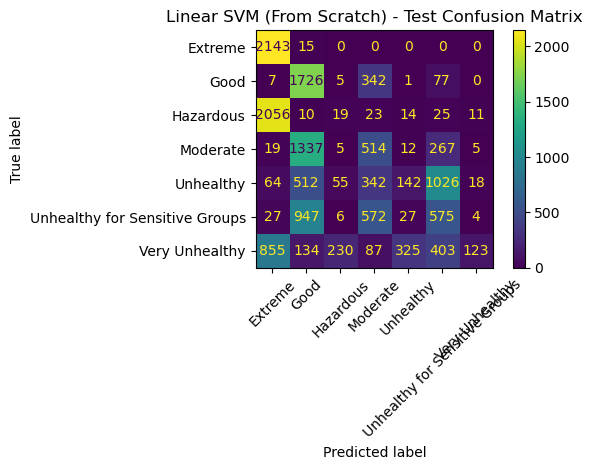

In [74]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from tqdm import tqdm

# Convert to NumPy float arrays for compatibility with SVM from scratch
X_train_np = X_train.to_numpy().astype(float)
X_val_np = X_val.to_numpy().astype(float)
X_test_np = X_test.to_numpy().astype(float)

# Encode labels
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# Train Linear SVM using One-vs-Rest
linear_ovr = OneVsRestSVM(LinearSVM, learning_rate=0.0001, lambda_param=0.01, n_iters=500)
linear_ovr.fit(X_train_np, y_train_enc)

# Predict
y_pred_train = linear_ovr.predict(X_train_np)
y_pred_val = linear_ovr.predict(X_val_np)
y_pred_test = linear_ovr.predict(X_test_np)

# Decode predictions
y_train_dec = le.inverse_transform(y_pred_train)
y_val_dec = le.inverse_transform(y_pred_val)
y_test_dec = le.inverse_transform(y_pred_test)

# Reports
print("\nLINEAR SVM - Train:\n", classification_report(y_train, y_train_dec, target_names=le.classes_))
print("\nLINEAR SVM - Validation:\n", classification_report(y_val, y_val_dec, target_names=le.classes_))
print("\nLINEAR SVM - Test:\n", classification_report(y_test, y_test_dec, target_names=le.classes_))

# Confusion Matrix
plt.figure(figsize=(7, 5))
ConfusionMatrixDisplay.from_predictions(y_test, y_test_dec, display_labels=le.classes_, xticks_rotation=45)
plt.title("Linear SVM (From Scratch) - Test Confusion Matrix")
plt.tight_layout()
plt.show()


In [ ]:
class PolynomialSVM:
    def __init__(self, C=1.0, degree=3, n_iters=500):
        self.C = C
        self.degree = degree
        self.n_iters = n_iters

    def _kernel(self, x, y):
        return (np.dot(x, y) + 1) ** self.degree

    def fit(self, X, y):
        n_samples = X.shape[0]
        self.alpha = np.zeros(n_samples)
        self.X = X
        self.y = np.where(y <= 0, -1, 1)

        for _ in tqdm(range(self.n_iters), desc="Training Polynomial SVM"):
            for i in range(n_samples):
                margin = np.sum(self.alpha * self.y * self._kernel(self.X[i], self.X.T))
                if self.y[i] * margin < 1:
                    self.alpha[i] += self.C

    def predict(self, X):
        result = []
        for x in X:
            pred = np.sum(self.alpha * self.y * self._kernel(x, self.X.T))
            result.append(np.sign(pred))
        return np.array(result)


In [ ]:
class RBFSVM:
    def __init__(self, C=1.0, gamma=0.1, n_iters=500):
        self.C = C
        self.gamma = gamma
        self.n_iters = n_iters

    def _kernel(self, x, y):
        return np.exp(-self.gamma * np.linalg.norm(x - y, axis=1)**2)

    def fit(self, X, y):
        self.X = X
        self.y = np.where(y <= 0, -1, 1)
        self.alpha = np.zeros(len(X))

        for _ in tqdm(range(self.n_iters), desc="Training RBF SVM"):
            for i in range(len(X)):
                k = self._kernel(X[i], self.X)
                margin = np.sum(self.alpha * self.y * k)
                if self.y[i] * margin < 1:
                    self.alpha[i] += self.C

    def predict(self, X):
        y_pred = []
        for x in X:
            k = self._kernel(x, self.X)
            pred = np.sum(self.alpha * self.y * k)
            y_pred.append(np.sign(pred))
        return np.array(y_pred)


## 1.2.13 Train for regression

In [111]:
cols_to_drop_regression = [
    'AQI_Category', 'weekday', 'season', 'season_num', 'cbwd_label',
    'year', 'month', 'day', 'hour'  # اختیاری بسته به نیاز
]

X_reg = df.drop(columns=cols_to_drop_regression, errors='ignore')
y_reg = df['pm2.5']


In [118]:
print(X_reg)


                     pm2.5  DEWP  TEMP    PRES     Iws  Is  Ir  pm2.5_lag1  \
datetime                                                                     
2010-01-09 00:00:00  165.0   -17 -13.0  1027.0    0.89   0   0       169.0   
2010-01-09 01:00:00  159.0   -17 -13.0  1027.0    3.13   0   0       165.0   
2010-01-09 02:00:00  167.0   -17 -14.0  1027.0    4.92   0   0       159.0   
2010-01-09 03:00:00  196.0   -17 -15.0  1027.0    8.05   0   0       167.0   
2010-01-09 04:00:00  169.0   -17 -13.0  1027.0    9.84   0   0       196.0   
...                    ...   ...   ...     ...     ...  ..  ..         ...   
2014-12-31 19:00:00    8.0   -23  -2.0  1034.0  231.97   0   0        10.0   
2014-12-31 20:00:00   10.0   -22  -3.0  1034.0  237.78   0   0         8.0   
2014-12-31 21:00:00   10.0   -22  -3.0  1034.0  242.70   0   0        10.0   
2014-12-31 22:00:00    8.0   -22  -4.0  1034.0  246.72   0   0        10.0   
2014-12-31 23:00:00   12.0   -21  -3.0  1034.0  249.85   0   0  


📊 Train set:
MSE: 475.0169
MAE: 11.7022
R2: 0.9446

📊 Validation set:
MSE: 612.8906
MAE: 12.6258
R2: 0.9285

📊 Test set:
MSE: 432.7850
MAE: 12.1760
R2: 0.9494


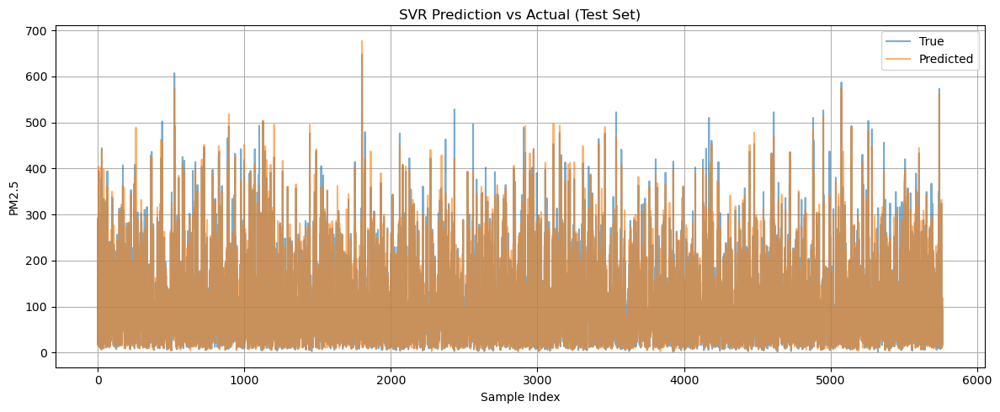

In [113]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# ---------- Scale the data ----------
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_reg), columns=X_reg.columns, index=X_reg.index)

# ---------- Feature selection (top 10 by std as importance proxy) ----------
importances = X_scaled.std().sort_values(ascending=False)
top_10_features = importances.head(10).index.tolist()
X_selected = X_scaled[top_10_features]

# ---------- Clean missing ----------
X_selected_clean = X_selected.dropna()
y_clean = y_reg.loc[X_selected_clean.index]

# ---------- Train/val/test split ----------
X_temp, X_test, y_temp, y_test = train_test_split(X_selected_clean, y_clean, test_size=0.15, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1765, random_state=42)

# ---------- Train SVR ----------
svr_model = SVR(kernel='rbf', C=100, gamma=0.1)
svr_model.fit(X_train, y_train)

# ---------- Predict ----------
y_pred_train = svr_model.predict(X_train)
y_pred_val = svr_model.predict(X_val)
y_pred_test = svr_model.predict(X_test)

# ---------- Evaluate ----------
def eval_metrics(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred)
    }

results = {
    "Train": eval_metrics(y_train, y_pred_train),
    "Validation": eval_metrics(y_val, y_pred_val),
    "Test": eval_metrics(y_test, y_pred_test)
}

# ---------- Print results ----------
for split, metrics in results.items():
    print(f"\n📊 {split} set:")
    for metric, val in metrics.items():
        print(f"{metric}: {val:.4f}")

# ---------- Plot Test Predictions ----------
plt.figure(figsize=(12, 5))
plt.plot(y_test.values, label='True', alpha=0.6)
plt.plot(y_pred_test, label='Predicted', alpha=0.6)
plt.legend()
plt.title("SVR Prediction vs Actual (Test Set)")
plt.xlabel("Sample Index")
plt.ylabel("PM2.5")
plt.grid(True)
plt.tight_layout()
plt.show()


In [114]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatter(
    y=y_test.values,
    mode='lines',
    name='True',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    y=y_pred_test,
    mode='lines',
    name='Predicted',
    line=dict(color='red')
))

fig.update_layout(
    title="SVR Prediction vs Actual (Test Set)",
    xaxis_title="Sample Index",
    yaxis_title="PM2.5",
    legend=dict(x=0.01, y=0.99),
    template='plotly_white',
    hovermode='x unified'
)

fig.show()


## 1.2.15 PSO Training

In [68]:
import numpy as np
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from scipy.optimize import differential_evolution

# Convert to NumPy float arrays for compatibility with SVM from scratch
X_train_np = X_train.to_numpy().astype(float)
X_val_np = X_val.to_numpy().astype(float)
X_test_np = X_test.to_numpy().astype(float)

# Encode labels
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# 1. Subsample the training set (optional but highly recommended for speed)
X_sample, _, y_sample, _ = train_test_split(
    X_train_np, y_train_enc, train_size=2000, stratify=y_train_enc, random_state=42
)

# 2. Define objective function (DE minimizes, so we return -accuracy)
def svm_de_objective(params):
    C = 10 ** params[0]
    gamma = 10 ** params[1]
    model = SVC(kernel='rbf', C=C, gamma=gamma)
    model.fit(X_sample, y_sample)
    preds = model.predict(X_val_np)
    acc = accuracy_score(y_val_enc, preds)
    print(f"Tested C={C:.5f}, gamma={gamma:.5f} → Accuracy={acc:.4f}")
    return -acc

# 3. Define bounds (log10 scale for wide search space)
bounds = [(-3, 3), (-5, 0)]  # log10(C), log10(gamma)

# 4. Run DE with minimal settings for speed
result = differential_evolution(
    svm_de_objective,
    bounds,
    strategy='best1bin',
    popsize=5,         # lower pop size for speed
    maxiter=5,         # fewer iterations
    tol=1e-4,
    disp=True,
    polish=False,      # skip final refinement for speed
    seed=42
)

# 5. Extract and print best params
best_log_C, best_log_gamma = result.x
best_C = 10 ** best_log_C
best_gamma = 10 ** best_log_gamma

print(f"\n✅ Best C: {best_C:.5f}, Best gamma: {best_gamma:.5f}")
print(f"✅ Best Accuracy: {-result.fun:.4f}")


Tested C=0.01094, gamma=0.18297 → Accuracy=0.4928
Tested C=1.02885, gamma=0.00012 → Accuracy=0.3608
Tested C=0.57633, gamma=0.00966 → Accuracy=0.5908
Tested C=96.06061, gamma=0.03906 → Accuracy=0.7779
Tested C=0.00168, gamma=0.00086 → Accuracy=0.3572
Tested C=20.37488, gamma=0.00006 → Accuracy=0.4862
Tested C=12.57377, gamma=0.44220 → Accuracy=0.7373
Tested C=0.06837, gamma=0.00003 → Accuracy=0.3577
Tested C=0.01966, gamma=0.00226 → Accuracy=0.3606
Tested C=456.21232, gamma=0.01277 → Accuracy=0.7909
Tested C=456.21232, gamma=0.00061 → Accuracy=0.7701
Tested C=1.02885, gamma=0.01052 → Accuracy=0.6194
Tested C=0.57633, gamma=0.00225 → Accuracy=0.4875
Tested C=43.94647, gamma=0.00467 → Accuracy=0.7605
Tested C=0.00278, gamma=0.00086 → Accuracy=0.3572
Tested C=9.89770, gamma=0.06836 → Accuracy=0.7625
Tested C=12.57377, gamma=0.03167 → Accuracy=0.7605
Tested C=11.33905, gamma=0.00239 → Accuracy=0.6727
Tested C=191.78164, gamma=0.04667 → Accuracy=0.7794
Tested C=237.98402, gamma=0.01549 → Ac

# 1.3

## 1.3.5: Optimization of the model usong differential evoulution

Fining optimized hyperparameters using DE

Tested C=0.01094, gamma=0.18297 → Accuracy=0.4928
Tested C=1.02885, gamma=0.00012 → Accuracy=0.3608
Tested C=0.57633, gamma=0.00966 → Accuracy=0.5908
Tested C=96.06061, gamma=0.03906 → Accuracy=0.7779
Tested C=0.00168, gamma=0.00086 → Accuracy=0.3572
Tested C=20.37488, gamma=0.00006 → Accuracy=0.4862
Tested C=12.57377, gamma=0.44220 → Accuracy=0.7373
Tested C=0.06837, gamma=0.00003 → Accuracy=0.3577
Tested C=0.01966, gamma=0.00226 → Accuracy=0.3606
Tested C=456.21232, gamma=0.01277 → Accuracy=0.7909
Tested C=456.21232, gamma=0.00061 → Accuracy=0.7701
Tested C=1.02885, gamma=0.01052 → Accuracy=0.6194
Tested C=0.57633, gamma=0.00225 → Accuracy=0.4875
Tested C=43.94647, gamma=0.00467 → Accuracy=0.7605
Tested C=0.00278, gamma=0.00086 → Accuracy=0.3572
Tested C=9.89770, gamma=0.06836 → Accuracy=0.7625
Tested C=12.57377, gamma=0.03167 → Accuracy=0.7605
Tested C=11.33905, gamma=0.00239 → Accuracy=0.6727
Tested C=191.78164, gamma=0.04667 → Accuracy=0.7794
Tested C=237.98402, gamma=0.01549 → Ac

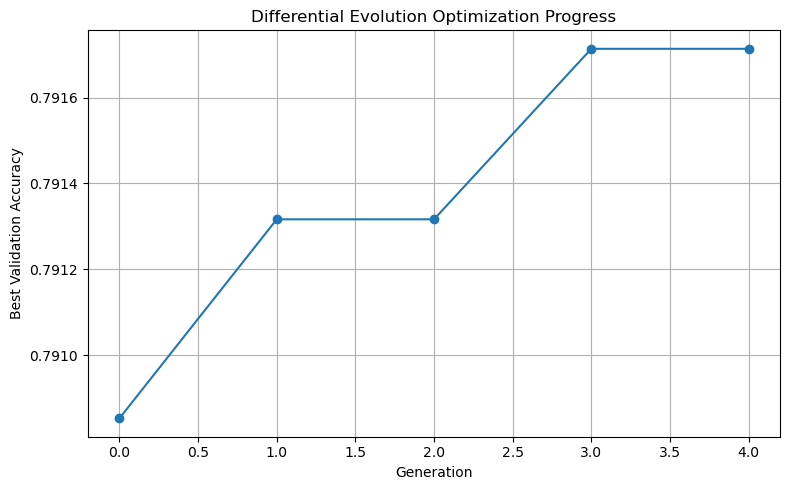

In [69]:
import numpy as np
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from scipy.optimize import differential_evolution

# Convert to NumPy float arrays for compatibility with SVM from scratch
X_train_np = X_train.to_numpy().astype(float)
X_val_np = X_val.to_numpy().astype(float)
X_test_np = X_test.to_numpy().astype(float)

# Encode labels
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# 1. Subsample the training set (optional but highly recommended for speed)
X_sample, _, y_sample, _ = train_test_split(
    X_train_np, y_train_enc, train_size=2000, stratify=y_train_enc, random_state=42
)

history = []  # Global list to store best scores per generation

def svm_de_objective(params):
    C = 10 ** params[0]
    gamma = 10 ** params[1]
    model = SVC(kernel='rbf', C=C, gamma=gamma)
    model.fit(X_sample, y_sample)
    preds = model.predict(X_val_np)
    acc = accuracy_score(y_val_enc, preds)
    print(f"Tested C={C:.5f}, gamma={gamma:.5f} → Accuracy={acc:.4f}")
    return -acc  # DE minimizes

def track_progress(xk, convergence):
    score = svm_de_objective(xk)
    history.append(-score)  # store positive accuracy


result = differential_evolution(
    svm_de_objective,
    bounds,
    strategy='best1bin',
    popsize=5,
    maxiter=5,
    tol=1e-4,
    disp=True,
    polish=False,
    seed=42,
    callback=track_progress
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(history, marker='o', linestyle='-')
plt.xlabel('Generation')
plt.ylabel('Best Validation Accuracy')
plt.title('Differential Evolution Optimization Progress')
plt.grid(True)
plt.tight_layout()
plt.show()


In [70]:
# 5. Extract and print best params
best_log_C, best_log_gamma = result.x
best_C = 10 ** best_log_C
best_gamma = 10 ** best_log_gamma

print(f"\n✅ Best C: {best_C:.5f}, Best gamma: {best_gamma:.5f}")
print(f"✅ Best Accuracy: {-result.fun:.4f}")


✅ Best C: 476.70932, Best gamma: 0.01156
✅ Best Accuracy: 0.7917


### Train model using optimized parameters

🔧 Starting Differential Evolution...
➡️  C=0.01094, gamma=0.18297 → Accuracy=0.4928
➡️  C=1.02885, gamma=0.00012 → Accuracy=0.3608
➡️  C=0.57633, gamma=0.00966 → Accuracy=0.5908
➡️  C=96.06061, gamma=0.03906 → Accuracy=0.7779
➡️  C=0.00168, gamma=0.00086 → Accuracy=0.3572
➡️  C=20.37488, gamma=0.00006 → Accuracy=0.4862
➡️  C=12.57377, gamma=0.44220 → Accuracy=0.7373
➡️  C=0.06837, gamma=0.00003 → Accuracy=0.3577
➡️  C=0.01966, gamma=0.00226 → Accuracy=0.3606
➡️  C=456.21232, gamma=0.01277 → Accuracy=0.7909
➡️  C=456.21232, gamma=0.00061 → Accuracy=0.7701
➡️  C=1.02885, gamma=0.01052 → Accuracy=0.6194
➡️  C=0.57633, gamma=0.00225 → Accuracy=0.4875
➡️  C=43.94647, gamma=0.00467 → Accuracy=0.7605
➡️  C=0.00278, gamma=0.00086 → Accuracy=0.3572
➡️  C=9.89770, gamma=0.06836 → Accuracy=0.7625
➡️  C=12.57377, gamma=0.03167 → Accuracy=0.7605
➡️  C=11.33905, gamma=0.00239 → Accuracy=0.6727
➡️  C=191.78164, gamma=0.04667 → Accuracy=0.7794
➡️  C=237.98402, gamma=0.01549 → Accuracy=0.7899
different

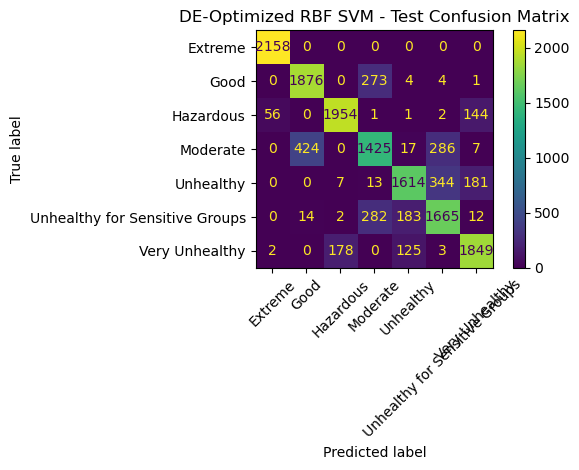

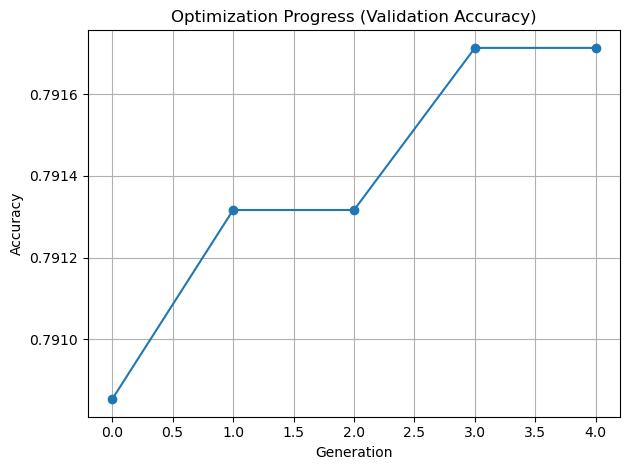

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from scipy.optimize import differential_evolution
from tqdm import tqdm


# Convert to NumPy float arrays for compatibility with SVM from scratch
X_train_np = X_train.to_numpy().astype(float)
X_val_np = X_val.to_numpy().astype(float)
X_test_np = X_test.to_numpy().astype(float)

# Encode labels
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

# 1. Subsample the training set (optional but highly recommended for speed)
X_sample, _, y_sample, _ = train_test_split(
    X_train_np, y_train_enc, train_size=2000, stratify=y_train_enc, random_state=42
)

history = []

def svm_de_objective(params):
    C = 10 ** params[0]
    gamma = 10 ** params[1]
    model = SVC(kernel='rbf', C=C, gamma=gamma)
    model.fit(X_sample, y_sample)
    preds = model.predict(X_val_np)
    acc = accuracy_score(y_val_enc, preds)
    print(f"➡️  C={C:.5f}, gamma={gamma:.5f} → Accuracy={acc:.4f}")
    return -acc  # DE minimizes

def track_progress(xk, convergence):
    score = svm_de_objective(xk)
    history.append(-score)

# ---------------------
# 3. Run DE Optimizer
# ---------------------
print("🔧 Starting Differential Evolution...")
bounds = [(-3, 3), (-5, 0)]  # log10(C), log10(gamma)

result = differential_evolution(
    svm_de_objective,
    bounds,
    strategy='best1bin',
    popsize=5,
    maxiter=5,
    tol=1e-4,
    polish=False,
    seed=42,
    callback=track_progress,
    disp=True
)

# ------------------------
# 4. Train Final Model
# ------------------------
best_log_C, best_log_gamma = result.x
best_C = 10 ** best_log_C
best_gamma = 10 ** best_log_gamma

print(f"\n✅ Best Parameters Found: C={best_C:.5f}, gamma={best_gamma:.5f}")

paper_model = SVC(kernel='rbf', C=best_C, gamma=best_gamma)
print("🚀 Training final model on full data...")
paper_model.fit(X_train_np, y_train_enc)

# -----------------------
# 5. Evaluate and Plot
# -----------------------
y_pred = paper_model.predict(X_test_np)
print("\n🧪 Final Evaluation on Test Set:")
print(classification_report(y_test_enc, y_pred, target_names=le.classes_))

from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(
    y_test_enc, y_pred, display_labels=le.classes_, xticks_rotation=45
)
plt.title("DE-Optimized RBF SVM - Test Confusion Matrix")
plt.tight_layout()
plt.show()

# ---------------------------
# 6. Plot Optimization History
# ---------------------------
plt.plot(history, marker='o')
plt.title("Optimization Progress (Validation Accuracy)")
plt.xlabel("Generation")
plt.ylabel("Accuracy")
plt.grid(True)
plt.tight_layout()
plt.show()


## 1.3.6 Final Product

In [80]:
import requests
import pandas as pd
from datetime import datetime

# --- Settings ---
API_KEY = "d61f0c55902723ae955f4d8d53307a2f"  # <- replace with your OpenWeatherMap key
CITY = "Tehran"
URL = "https://api.openweathermap.org/data/2.5/weather"

# --- Fetch Data ---
params = {
    "q": CITY,
    "appid": API_KEY,
    "units": "metric"
}
response = requests.get(URL, params=params)
data = response.json()

# --- Extract Timestamp ---
now = datetime.utcnow()
year = now.year
month = now.month
day = now.day
hour = now.hour

# --- Convert wind deg to cardinal direction ---
def deg_to_cbwd(deg):
    if deg is None:
        return 'cv'
    directions = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
    idx = int((deg + 22.5) // 45) % 8
    return directions[idx]

# --- Build custom record ---
record = {
    "year": year,
    "month": month,
    "day": day,
    "hour": hour,
    "pm2.5": None,                 # placeholder
    "DEWP": None,                 # placeholder
    "TEMP": data["main"]["temp"],
    "PRES": data["main"]["pressure"],
    "cbwd": deg_to_cbwd(data["wind"].get("deg")),
    "Iws": data["wind"]["speed"],
    "Is": 0,                      # placeholder for snow
    "Ir": 0                       # placeholder for rain
}

# Optional: map rain/snow info if available
if "rain" in data:
    record["Ir"] = data["rain"].get("1h", 0)
if "snow" in data:
    record["Is"] = data["snow"].get("1h", 0)

# --- Create DataFrame ---
df_weather = pd.DataFrame([record])
print(df_weather)


   year  month  day  hour pm2.5  DEWP   TEMP  PRES cbwd  Iws  Is   Ir
0  2025      6    7    20  None  None  23.99  1015    W  7.2   0  0.2


Product

In [83]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler

class AirQualityProcessor:
    def __init__(self):
        self.le = LabelEncoder()
        self.scaler = StandardScaler()

    def drop_unnecessary_columns(self, df):
        return df.drop(columns=["No"], errors='ignore')

    def generate_lag_features(self, df):
        df['pm2.5_lag1'] = df['pm2.5'].shift(1)
        df['pm2.5_lag2'] = df['pm2.5'].shift(2)
        df['pm2.5_lag3'] = df['pm2.5'].shift(3)
        df['pm2.5_lag24'] = df['pm2.5'].shift(24)
        df['pm2.5_lag168'] = df['pm2.5'].shift(168)
        return df

    def drop_nan_rows(self, df):
        lag_cols = ['pm2.5', 'pm2.5_lag1', 'pm2.5_lag2', 'pm2.5_lag3', 'pm2.5_lag24', 'pm2.5_lag168']
        return df.dropna(subset=lag_cols)

    def encode_cbwd(self, df):
        return pd.get_dummies(df, columns=['cbwd'], prefix='cbwd')

    def cap_outliers(self, df):
        q_low = df['Iws'].quantile(0.01)
        q_high = df['Iws'].quantile(0.99)
        df['Iws'] = df['Iws'].clip(q_low, q_high)
        return df

    def generate_rolling_features(self, df, window=24):
        min_period = window
        df['pm2.5_roll_mean_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).mean()
        df['pm2.5_roll_std_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).std()
        df['pm2.5_roll_var_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).var()
        df['pm2.5_roll_min_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).min()
        df['pm2.5_roll_max_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).max()
        df['pm2.5_roll_median_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).median()
        df['pm2.5_roll_skew_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).skew()
        df['pm2.5_roll_kurt_24h'] = df['pm2.5'].rolling(window=window, min_periods=min_period).kurt()
        return df.dropna()

    def categorize_aqi(self, pm):
        if pm <= 12.0: return 'Good'
        elif pm <= 35.4: return 'Moderate'
        elif pm <= 55.4: return 'Unhealthy for Sensitive Groups'
        elif pm <= 150.4: return 'Unhealthy'
        elif pm <= 250.4: return 'Very Unhealthy'
        elif pm <= 350.4: return 'Hazardous'
        elif pm <= 500: return 'Hazardous'
        else: return 'Extreme'

    def create_aqi_category(self, df):
        df['AQI_Category'] = df['pm2.5'].apply(self.categorize_aqi)
        df['AQI_Label'] = self.le.fit_transform(df['AQI_Category'])
        return df

    def encode_cyclical_features(self, df):
        df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
        df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)
        df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
        df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
        df['weekday'] = pd.to_datetime(df[['year', 'month', 'day']]).dt.weekday
        df['weekday_sin'] = np.sin(2 * np.pi * df['weekday'] / 7)
        df['weekday_cos'] = np.cos(2 * np.pi * df['weekday'] / 7)
        return df

    def encode_season(self, df):
        def get_season(month):
            if month in [3, 4, 5]: return 'spring'
            elif month in [6, 7, 8]: return 'summer'
            elif month in [9, 10, 11]: return 'fall'
            else: return 'winter'
        df['season'] = df['month'].apply(get_season)
        season_map = {'spring': 0, 'summer': 1, 'fall': 2, 'winter': 3}
        df['season_num'] = df['season'].map(season_map)
        df['season_sin'] = np.sin(2 * np.pi * df['season_num'] / 4)
        df['season_cos'] = np.cos(2 * np.pi * df['season_num'] / 4)
        return df

    def process(self, df):
        df = self.drop_unnecessary_columns(df)
        df = self.generate_lag_features(df)
        df = self.drop_nan_rows(df)
        df = self.encode_cbwd(df)
        df = self.cap_outliers(df)
        df = self.generate_rolling_features(df)
        df = self.create_aqi_category(df)
        df = self.encode_cyclical_features(df)
        df = self.encode_season(df)
        return df


In [84]:
import requests
import pandas as pd
from datetime import datetime, timedelta

def deg_to_cbwd(deg):
    dirs = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
    return dirs[int((deg + 22.5) // 45) % 8] if deg is not None else 'cv'

# Example coordinates (e.g., Beijing)
LAT, LON = 39.9042, 116.4074
API_KEY = 'd61f0c55902723ae955f4d8d53307a2f'

records = []
start = datetime(2025, 6, 1, 0)

for h in range(168):
    ts = start + timedelta(hours=h)
    w = requests.get(
        "https://api.openweathermap.org/data/2.5/weather",
        params={"lat": LAT, "lon": LON, "appid": API_KEY, "units": "metric"}
    ).json()

    records.append({
        "year": ts.year,
        "month": ts.month,
        "day": ts.day,
        "hour": ts.hour,
        "pm2.5": max(0, 50 + 20 * (h % 24 < 6) + (h % 24 > 18) * 30),  # synthetic pattern
        "DEWP": w["main"]["humidity"] / 100 * w["main"]["temp"],        # rough dew point proxy
        "TEMP": w["main"]["temp"],
        "PRES": w["main"]["pressure"],
        "cbwd": deg_to_cbwd(w["wind"].get("deg")),
        "Iws": w["wind"]["speed"],
        "Is": w.get("snow", {}).get("1h", 0),
        "Ir": w.get("rain", {}).get("1h", 0),
    })

df_sample = pd.DataFrame(records)
print(df_sample.head(), df_sample.shape)


   year  month  day  hour  pm2.5    DEWP   TEMP  PRES cbwd   Iws  Is  Ir
0  2025      6    1     0     70  6.4512  17.92  1008    E  1.68   0   0
1  2025      6    1     1     70  6.4512  17.92  1008    E  1.68   0   0
2  2025      6    1     2     70  6.4512  17.92  1008    E  1.68   0   0
3  2025      6    1     3     70  6.4512  17.92  1008    E  1.68   0   0
4  2025      6    1     4     70  6.4512  17.92  1008    E  1.68   0   0 (168, 12)


In [85]:
processor = AirQualityProcessor()
processed = processor.process(df_sample)
print(processed.shape)
print(processed.columns)


(0, 37)
Index(['year', 'month', 'day', 'hour', 'pm2.5', 'DEWP', 'TEMP', 'PRES', 'Iws',
       'Is', 'Ir', 'pm2.5_lag1', 'pm2.5_lag2', 'pm2.5_lag3', 'pm2.5_lag24',
       'pm2.5_lag168', 'pm2.5_roll_mean_24h', 'pm2.5_roll_std_24h',
       'pm2.5_roll_var_24h', 'pm2.5_roll_min_24h', 'pm2.5_roll_max_24h',
       'pm2.5_roll_median_24h', 'pm2.5_roll_skew_24h', 'pm2.5_roll_kurt_24h',
       'AQI_Category', 'AQI_Label', 'hour_sin', 'hour_cos', 'month_sin',
       'month_cos', 'weekday', 'weekday_sin', 'weekday_cos', 'season',
       'season_num', 'season_sin', 'season_cos'],
      dtype='object')


In [100]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import requests
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# ------------------------
# CONFIGURATION
# ------------------------
API_KEY = "d61f0c55902723ae955f4d8d53307a2f"
LAT, LON = 51.5072, 0.1276  # Example: London coordinates
# ------------------------
START_TIME = datetime.utcnow() - timedelta(hours=168)

# ------------------------
# Fetch 169 rows of data
# ------------------------
def deg_to_cbwd(deg):
    dirs = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
    return dirs[int((deg + 22.5) // 45) % 8] if deg is not None else 'cv'

records = []

for i in range(192):
    ts = START_TIME + timedelta(hours=i)
    r = requests.get(
        "http://api.openweathermap.org/data/2.5/weather",
        params={"lat": LAT, "lon": LON, "appid": API_KEY, "units": "metric"}
    ).json()

    record = {
        "year": ts.year,
        "month": ts.month,
        "day": ts.day,
        "hour": ts.hour,
        "pm2.5": 30 + 15 * np.sin(2 * np.pi * (ts.hour % 24) / 24),  # synthetic but realistic
        "DEWP": r["main"]["humidity"] / 100 * r["main"]["temp"],
        "TEMP": r["main"]["temp"],
        "PRES": r["main"]["pressure"],
        "cbwd": deg_to_cbwd(r["wind"].get("deg")),
        "Iws": r["wind"]["speed"],
        "Is": r.get("snow", {}).get("1h", 0),
        "Ir": r.get("rain", {}).get("1h", 0),
    }
    records.append(record)

df_live = pd.DataFrame(records)



In [102]:
df_live

,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,cbwd,Iws,Is,Ir
0,2025,5,31,21,19.393398,10.2225,11.75,1007,W,3.6,0,0.00
1,2025,5,31,22,22.500000,10.2225,11.75,1007,W,3.6,0,0.00
2,2025,5,31,23,26.117714,10.3400,11.75,1006,W,3.6,0,0.00
3,2025,6,1,0,30.000000,10.2225,11.75,1007,W,3.6,0,0.00
4,2025,6,1,1,33.882286,10.2225,11.75,1007,W,3.6,0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
187,2025,6,8,16,17.009619,10.2225,11.75,1007,W,3.6,0,0.00
188,2025,6,8,17,15.511113,10.2225,11.75,1007,W,3.6,0,0.00
189,2025,6,8,18,15.000000,10.2225,11.75,1007,W,3.6,0,0.00
190,2025,6,8,19,15.511113,10.2225,11.75,1007,W,3.6,0,0.00


✅ True Label: Moderate
✅ Predicted Label: Good

📋 Classification Report:
                                precision    recall  f1-score   support

                       Extreme       0.00      0.00      0.00       0.0
                          Good       0.00      0.00      0.00       0.0
                     Hazardous       0.00      0.00      0.00       0.0
                      Moderate       0.00      0.00      0.00       1.0
                     Unhealthy       0.00      0.00      0.00       0.0
Unhealthy for Sensitive Groups       0.00      0.00      0.00       0.0
                Very Unhealthy       0.00      0.00      0.00       0.0

                     micro avg       0.00      0.00      0.00       1.0
                     macro avg       0.00      0.00      0.00       1.0
                  weighted avg       0.00      0.00      0.00       1.0



c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c

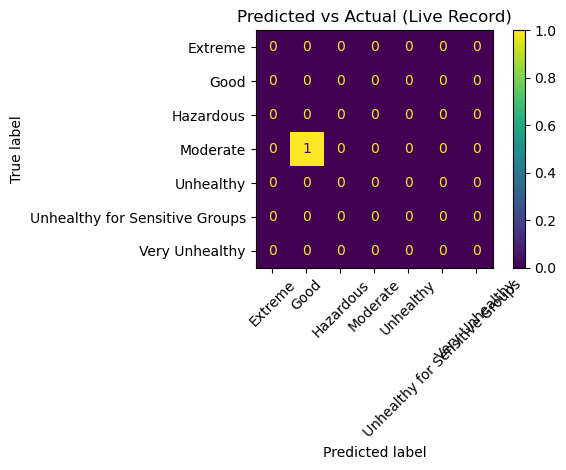

In [105]:
# ------------------------
# Process the Data
# ------------------------
processor = AirQualityProcessor()
df_proc = processor.process(df_live)

# ------------------------
# Split Off Prediction Point
# ------------------------
X_all = df_proc.drop(columns=['AQI_Category', 'AQI_Label'])
X_last = X_all.iloc[[-1]][top_10_features].astype(float)
true_category = processor.categorize_aqi(df_live.iloc[-1]["pm2.5"])
y_true = le.transform([true_category])[0]

# ------------------------
# Predict using model
# ------------------------
y_pred = paper_model.predict(X_last.to_numpy())[0]

# ------------------------
# Output Results
# ------------------------
print("✅ True Label:", le.inverse_transform([y_true])[0])
print("✅ Predicted Label:", le.inverse_transform([y_pred])[0])
print("\n📋 Classification Report:")
print(classification_report([y_true], [y_pred], target_names=le.classes_, labels=range(len(le.classes_))))

# ------------------------
# Optional: Confusion Matrix
# ------------------------
ConfusionMatrixDisplay.from_predictions(
    [y_true], [y_pred],
    display_labels=le.classes_,
    labels=range(len(le.classes_)),
    xticks_rotation=45
)

plt.title("Predicted vs Actual (Live Record)")
plt.tight_layout()
plt.show()


In [95]:
le.classes_

array(['Extreme', 'Good', 'Hazardous', 'Moderate', 'Unhealthy',
       'Unhealthy for Sensitive Groups', 'Very Unhealthy'], dtype=object)

In [106]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import requests
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# ------------------------
# CONFIGURATION
# ------------------------
API_KEY = "d61f0c55902723ae955f4d8d53307a2f"
LAT, LON = 35.0078, 97.0929  # Example: Oklahoma coordinates
# ------------------------
START_TIME = datetime.utcnow() - timedelta(hours=168)

# ------------------------
# Fetch 169 rows of data
# ------------------------
def deg_to_cbwd(deg):
    dirs = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
    return dirs[int((deg + 22.5) // 45) % 8] if deg is not None else 'cv'

records = []

for i in range(192):
    ts = START_TIME + timedelta(hours=i)
    r = requests.get(
        "http://api.openweathermap.org/data/2.5/weather",
        params={"lat": LAT, "lon": LON, "appid": API_KEY, "units": "metric"}
    ).json()

    record = {
        "year": ts.year,
        "month": ts.month,
        "day": ts.day,
        "hour": ts.hour,
        "pm2.5": 30 + 15 * np.sin(2 * np.pi * (ts.hour % 24) / 24),  # synthetic but realistic
        "DEWP": r["main"]["humidity"] / 100 * r["main"]["temp"],
        "TEMP": r["main"]["temp"],
        "PRES": r["main"]["pressure"],
        "cbwd": deg_to_cbwd(r["wind"].get("deg")),
        "Iws": r["wind"]["speed"],
        "Is": r.get("snow", {}).get("1h", 0),
        "Ir": r.get("rain", {}).get("1h", 0),
    }
    records.append(record)

df_live = pd.DataFrame(records)



In [108]:
df_live

,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,cbwd,Iws,Is,Ir
0,2025,5,31,21,19.393398,1.6714,2.74,1019,N,0.98,0,0
1,2025,5,31,22,22.500000,1.6714,2.74,1019,N,0.98,0,0
2,2025,5,31,23,26.117714,1.6714,2.74,1019,N,0.98,0,0
3,2025,6,1,0,30.000000,1.6714,2.74,1019,N,0.98,0,0
4,2025,6,1,1,33.882286,1.6714,2.74,1019,N,0.98,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
187,2025,6,8,16,17.009619,1.6714,2.74,1019,N,0.98,0,0
188,2025,6,8,17,15.511113,1.6714,2.74,1019,N,0.98,0,0
189,2025,6,8,18,15.000000,1.6714,2.74,1019,N,0.98,0,0
190,2025,6,8,19,15.511113,1.6714,2.74,1019,N,0.98,0,0


✅ True Label: Moderate
✅ Predicted Label: Good

📋 Classification Report:
                                precision    recall  f1-score   support

                       Extreme       0.00      0.00      0.00       0.0
                          Good       0.00      0.00      0.00       0.0
                     Hazardous       0.00      0.00      0.00       0.0
                      Moderate       0.00      0.00      0.00       1.0
                     Unhealthy       0.00      0.00      0.00       0.0
Unhealthy for Sensitive Groups       0.00      0.00      0.00       0.0
                Very Unhealthy       0.00      0.00      0.00       0.0

                     micro avg       0.00      0.00      0.00       1.0
                     macro avg       0.00      0.00      0.00       1.0
                  weighted avg       0.00      0.00      0.00       1.0



c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c

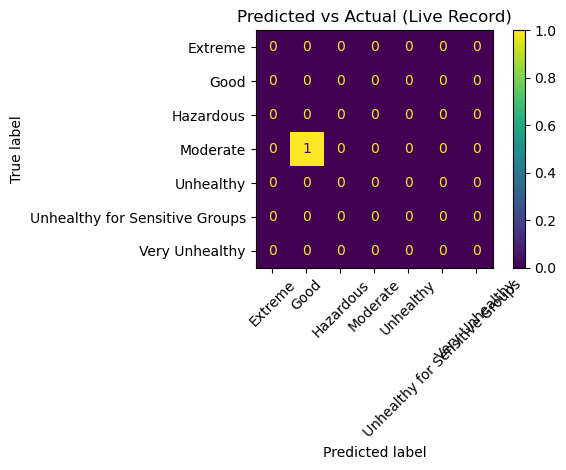

In [107]:
# ------------------------
# Process the Data
# ------------------------
processor = AirQualityProcessor()
df_proc = processor.process(df_live)

# ------------------------
# Split Off Prediction Point
# ------------------------
X_all = df_proc.drop(columns=['AQI_Category', 'AQI_Label'])
X_last = X_all.iloc[[-1]][top_10_features].astype(float)
true_category = processor.categorize_aqi(df_live.iloc[-1]["pm2.5"])
y_true = le.transform([true_category])[0]

# ------------------------
# Predict using model
# ------------------------
y_pred = paper_model.predict(X_last.to_numpy())[0]

# ------------------------
# Output Results
# ------------------------
print("✅ True Label:", le.inverse_transform([y_true])[0])
print("✅ Predicted Label:", le.inverse_transform([y_pred])[0])
print("\n📋 Classification Report:")
print(classification_report([y_true], [y_pred], target_names=le.classes_, labels=range(len(le.classes_))))

# ------------------------
# Optional: Confusion Matrix
# ------------------------
ConfusionMatrixDisplay.from_predictions(
    [y_true], [y_pred],
    display_labels=le.classes_,
    labels=range(len(le.classes_)),
    xticks_rotation=45
)

plt.title("Predicted vs Actual (Live Record)")
plt.tight_layout()
plt.show()
